In [8]:
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set(style="white", palette="Paired")

%load_ext autoreload
%autoreload 2

import numpy as np
import gym
import sys
import os
if "../" not in sys.path:
    sys.path.insert(0, "../")

    
from logger import *
setup_logging(default_level=logging.INFO)

from sklearn import manifold, datasets
from sklearn.utils import check_random_state


from algo.lstd import LSTDQ, LSTDMu, LSPI
from algo.policy import RandomPolicy2, LinearQ2
from algo.fa import LinearQ3
from algo.apprenticeship_learning import ApprenticeshipLearning as AL
from env.simulator import * 
from util.plotting import *
from util.basis import *


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [9]:
env_id = "MountainCar-v0"
env = gym.envs.make(env_id)
state_dim = env.observation_space.shape[0]
# discrete action
action_dim = 1
n_action = env.action_space.n
action_list = range(env.action_space.n)
sim = Simulator(env, state_dim=state_dim, action_dim=action_dim)
# default
s_init = [-0.5, 0]

WARN: gym.spaces.Box autodetected dtype as <class 'numpy.float32'>. Please provide explicit dtype.


In [10]:
# hack to give us control over the initial state
import types

def new_timelimit_reset(self, s_init=None):
    import time
    self._episode_started_at = time.time()
    self._elapsed_steps = 0
    return self.env.reset(s_init)

def new_reset(self, s_init):
    if s_init is None:
        s_init = [np.random.uniform(-0.6, -0.4), 0]
    self.state = np.array(s_init)
    return np.array(self.state)
env.reset = types.MethodType(new_timelimit_reset, env)
env.env.reset = types.MethodType(new_reset, env.env)
print(env.reset([-.3, 0.3]))

[-0.3  0.3]


## obtain expert policy $\pi_{exp}$
- with linearly paramatized Q
- with radial basis function

In [11]:
include_action = False
# if this is True, then the state space becomes very large
# therefore, a more denser, higher number of phi is needed

p_linear = 2 * n_action
q_linear = 2 * n_action
phi_linear = LinearKernel2(p_linear, n_action, include_action).transform
psi_linear = phi_linear

n_component_list = [10, 10]
gamma_list = [0.5, 30.0]
#gamma_list = [0.5, 5.0, 30.0]
p_rbf =  int(np.sum(n_component_list)) * n_action
q_rbf = int(np.sum(n_component_list)) * n_action

# technically the truly-batch mode should use D to fit rbf kenel
states = np.array([env.observation_space.sample() for x in range(10000)])
phi_rbf = RBFKernel2(states, n_action, p_rbf, n_component_list, gamma_list, include_action).transform
psi_rbf = phi_rbf

precision = 1e-2
eps = 0.01
gamma = 0.99

n_component = 5
add_bias = True
standardized = True
p_gaus = (n_component**2 + int(add_bias)) * n_action
phi_gaus = GaussianKernel(states, n_action, p_gaus, n_component, include_action, add_bias, standardized).transform

/usr/local/lib64/python3.6/site-packages/sklearn/linear_model/stochastic_gradient.py:128: FutureWarning: max_iter and tol parameters have been added in <class 'sklearn.linear_model.stochastic_gradient.SGDRegressor'> in 0.19. If both are left unset, they default to max_iter=5 and tol=None. If tol is not None, max_iter defaults to max_iter=1000. From 0.21, default max_iter will be 1000, and default tol will be 1e-3.
  "and default tol will be 1e-3." % type(self), FutureWarning)


Step 114 @ Episode 150/150 (-116.0)

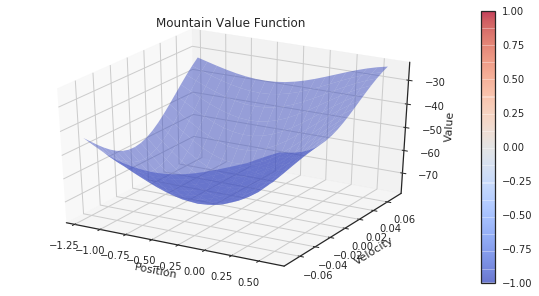

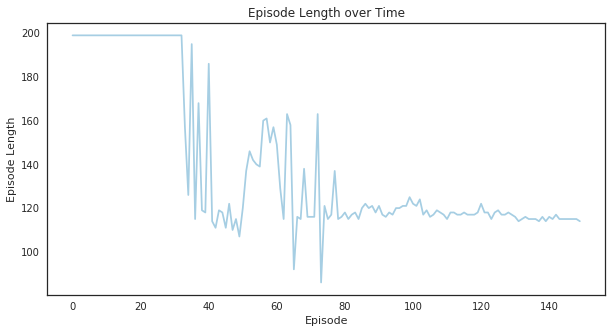

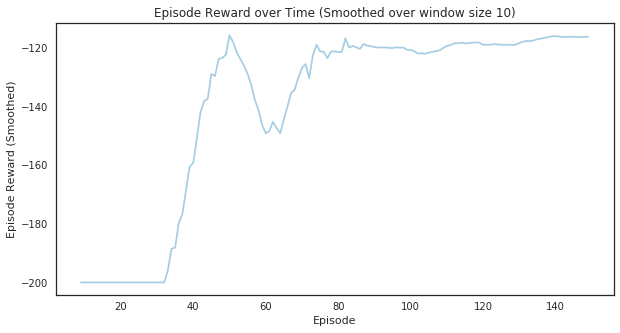

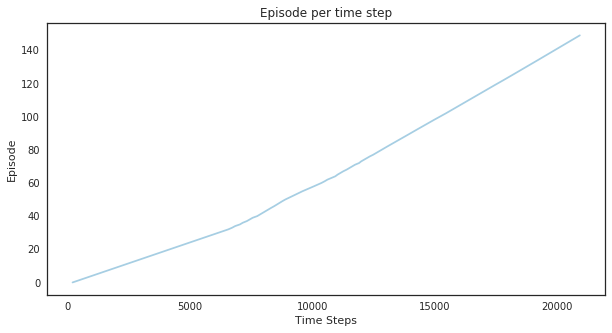

(<matplotlib.figure.Figure at 0x7fed696fb0b8>,
 <matplotlib.figure.Figure at 0x7fed695c1b70>)

In [12]:
phi = phi_gaus
p = p_gaus

mdp_solver = LinearQ3(env=env,
                      phi=phi,
                      p=p,
                      action_list=action_list,
                      n_episode=150,
                      epsilon=0.0,
                      epsilon_decay=1.00,
                      gamma=gamma)

pi_expert, stats = mdp_solver.solve(reward_fn=None)
plotting.plot_cost_to_go_mountain_car(env, pi_expert._estimator)
plotting.plot_episode_stats(stats, smoothing_window=10)

## generate trajectories under expert policy (=D)

In [13]:
class NearExpertPolicy():
    """
    hard-coded near-optimal expert policy
    for mountaincar-v0
    """
    def choose_action(self, s):
        pos, v = s
        c = 0
        return 0 if v <= c else 2

class AntiClimacticPolicy():
    """
    hard-coded near-optimal expert policy
    for mountaincar-v0
    """
    def choose_action(self, s):
        pos, v = s
        c = 0
        if  v <= 0: 
            return 0
        else:
            if -0.9 < pos < -0.4:
                # slowdown
                return 0
            return 2
    
class OppositeNearExpertPolicy():
    """
    hard-coded near-optimal expert policy
    for mountaincar-v0
    """
    def choose_action(self, s):
        pos, v = s
        c = np.random.uniform(-0.1, 0.1)
        return 0 if v > c else 2
    
pi_near = NearExpertPolicy()
pi_near_ops = OppositeNearExpertPolicy()
pi_random = RandomPolicy2(action_list)


In [14]:
# mixed training set
pi_list = [pi_random, pi_near_ops, pi_near, pi_expert]
mix_ratio = [0.1, 0.1, 0.1, 0.7]
sample_size = 100

D = sim.simulate_mixed(env, pi_list, sample_size, mix_ratio)
D_mat = Simulator.to_matrix(D)

# pure expert

D_pure = sim.simulate(pi_expert, 1, 30)
D_pure_mat = Simulator.to_matrix(D_pure)


Step 114 @ Episode 30/30 (-123.0)

## visualize the traning datasets
- mixed training set
- purely expert training dataset
- full coverage training dataset

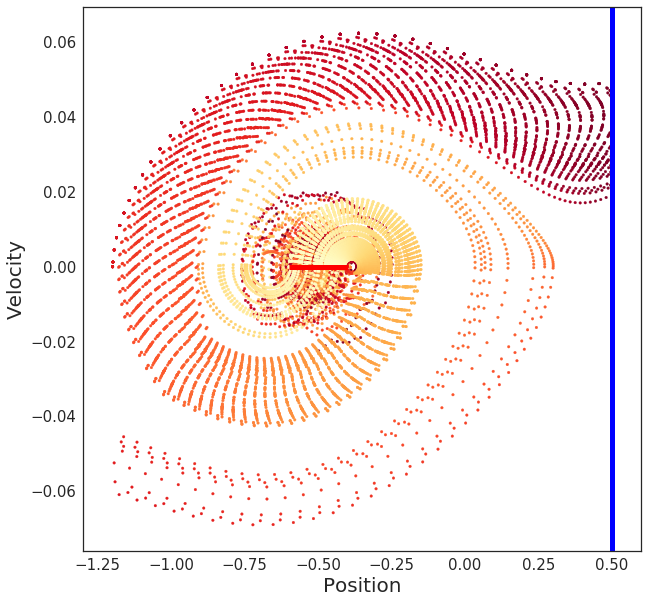

In [15]:
plot_trajectory_mountain_car(D)

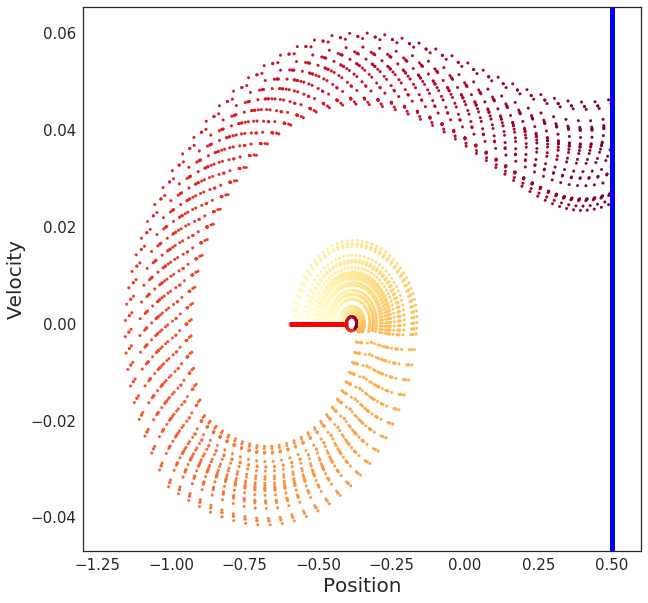

In [16]:
plot_trajectory_mountain_car(D_pure)

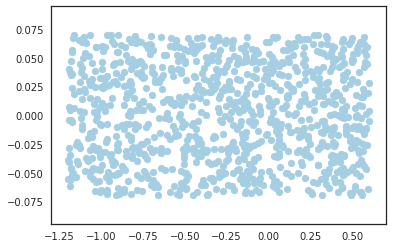

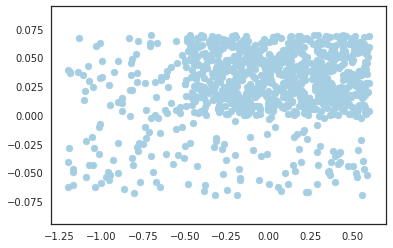

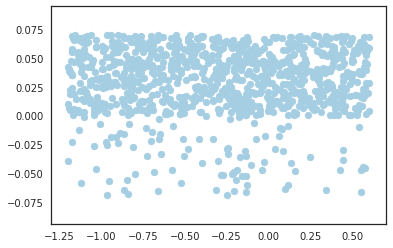

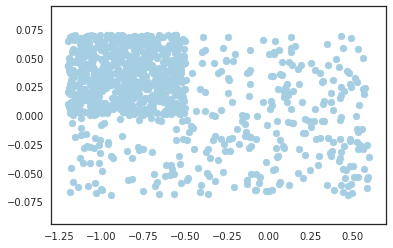

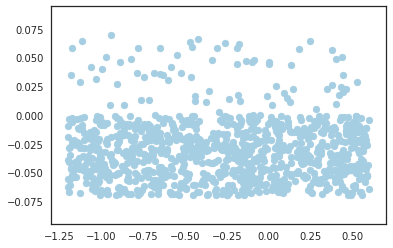

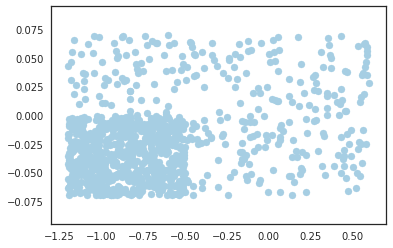

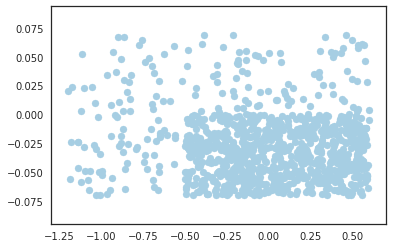

In [33]:
def generate_state_samples(env, pi, predicate=None, n_sample=1000):
    """
    a hacky way to cover most state space uniformly
    """
    D = []
    for s in states:
        if predicate is not None and not predicate(s) and np.random.uniform(0, 1) > 0.1:
            continue
        env.reset(s)
        a = pi.choose_action(s)
        s_next, r, done, _ = env.step(a)
        # one transition = one episode
        absorb = s[0] > 0.5 or s_next[0] > 0.5
        D.append(np.array([[s, a, r, s_next, absorb, done]]))
        
        if len(D) > n_sample:
            break
    return D

def predicate1(s):
    """
    covers Q2
    """
    pos, vel = s
    return vel > 0 and pos > -.5

def predicate12(s):
    """
    covers Q1, Q2
    """
    pos, vel = s
    return vel > 0

def predicate2(s):
    """
    covers Q2
    """
    pos, vel = s
    return vel > 0 and pos < -.5

def predicate34(s):
    """
    covers Q3, Q4
    """
    pos, vel = s
    return vel < 0

def predicate4(s):
    """
    covers Q2
    """
    pos, vel = s
    return vel < 0 and pos > -.5

def predicate3(s):
    """
    covers Q2
    """
    pos, vel = s
    return vel < 0 and pos < -.5

D_fake_size = 1000

D_fake = generate_state_samples(env, pi_random, None, D_fake_size)
D_fake_mat = Simulator.to_matrix(D_fake)
plt.figure()
ss = np.array([list(s) for s in D_fake_mat[:, 0]])
plt.scatter(ss[:, 0], ss[:, 1])

D_fake1 = generate_state_samples(env, pi_random, predicate1, D_fake_size)
D_fake_mat1 = Simulator.to_matrix(D_fake1)

plt.figure()
ss = np.array([list(s) for s in D_fake_mat1[:, 0]])
plt.scatter(ss[:, 0], ss[:, 1])


D_fake12 = generate_state_samples(env, pi_random, predicate12, D_fake_size)
D_fake_mat12 = Simulator.to_matrix(D_fake12)

plt.figure()
ss = np.array([list(s) for s in D_fake_mat12[:, 0]])
plt.scatter(ss[:, 0], ss[:, 1])

D_fake2 = generate_state_samples(env, pi_random, predicate2, D_fake_size)
D_fake_mat2 = Simulator.to_matrix(D_fake2)
plt.figure()
ss = np.array([list(s) for s in D_fake_mat2[:, 0]])
plt.scatter(ss[:, 0], ss[:, 1])


D_fake34 = generate_state_samples(env, pi_random, predicate34, D_fake_size)
D_fake_mat34 = Simulator.to_matrix(D_fake34)
plt.figure()
ss = np.array([list(s) for s in D_fake_mat34[:, 0]])
plt.scatter(ss[:, 0], ss[:, 1])

D_fake3 = generate_state_samples(env, pi_random, predicate3, D_fake_size)
D_fake_mat3 = Simulator.to_matrix(D_fake3)
plt.figure()
ss = np.array([list(s) for s in D_fake_mat3[:, 0]])
plt.scatter(ss[:, 0], ss[:, 1])


D_fake4 = generate_state_samples(env, pi_random, predicate4, D_fake_size)
D_fake_mat4 = Simulator.to_matrix(D_fake4)
plt.figure()
ss = np.array([list(s) for s in D_fake_mat4[:, 0]])
plt.scatter(ss[:, 0], ss[:, 1])

# consider color by action

## study the behavior of $\gamma$
- small gamma (high variance) gives sparse coding but requires less centers (components)
- large gamma (low variance) gives dense coding but requires more centers (components)
- components: need enough (also need to consider gamma) numbers to cover the state space 

## Solve MountainCar-v0 with LSPI


In [ ]:
def solve_mountain_car(p, phi, gamma, precision, eps, D, reward_fn=None, max_iter=10):  
    W_0 = np.random.rand(p)
    lspi = LSPI(D=D,
                action_list=action_list,
                p=p,
                phi=phi,
                gamma=gamma,
                precision=precision,
                eps=eps,
                W_0=W_0,
                reward_fn=reward_fn,
                max_iter=max_iter)

    W, w_list = lspi.solve()
    return W, w_list

datasets = [D_fake_mat, D_fake_mat1, D_fake_mat12, D_fake_mat2, D_fake_mat3, D_fake_mat34, D_fake_mat4]
names = ["normal", "1", "12", "2", "3", "34", "4"]
coverage_results = {} 
for data, name in zip(datasets, names):
    print(name)
    w_gaus, w_list = solve_mountain_car(p_gaus, phi_gaus, gamma, precision, eps, data, None, 5)
    coverage_results[name] = w_list
    print("")

INFO:root:fitting D of the dimension:
(1001, 6)


normal


INFO:root:lspi norm 303276.6859972365
INFO:root:lspi norm 26352.523393242347
INFO:root:lspi norm 597.5379633872052
INFO:root:lspi norm 37.94132718129543
INFO:root:lspi norm 1.4951187192903634
INFO:root:lspi norm 0.0
INFO:root:fitting D of the dimension:
(1001, 6)



1


INFO:root:lspi norm 200222.573151515
INFO:root:lspi norm 24967.240984964268
INFO:root:lspi norm 16364.88476364126
INFO:root:lspi norm 875.5533400493225
INFO:root:lspi norm 392.65110983670206
INFO:root:lspi norm 10.489436438713817
INFO:root:lspi norm 0.936778166513897
INFO:root:fitting D of the dimension:
(1001, 6)



12


INFO:root:lspi norm 19367.107365520704
INFO:root:lspi norm 11938.864496914983
INFO:root:lspi norm 8080.082067757006
INFO:root:lspi norm 5006.105191610518
INFO:root:lspi norm 2032.481560380599
INFO:root:lspi norm 1438.750998225248
INFO:root:lspi norm 719.2158794433826
INFO:root:fitting D of the dimension:
(1001, 6)



2


INFO:root:lspi norm 126803.54371885024
INFO:root:lspi norm 51113.3512562777
INFO:root:lspi norm 39250.69003429605
INFO:root:lspi norm 8928.040366210063
INFO:root:lspi norm 6312.930910504826
INFO:root:lspi norm 428.66938220129003
INFO:root:lspi norm 65.79459121341165
INFO:root:fitting D of the dimension:
(1001, 6)



3


INFO:root:lspi norm 318020.77727954235
INFO:root:lspi norm 30015.743608126897
INFO:root:lspi norm 25323.645837247394
INFO:root:lspi norm 5461.99501946275
INFO:root:lspi norm 56048.82554291272
INFO:root:lspi norm 63503.948881401535
INFO:root:lspi norm 7443.076643432565
INFO:root:fitting D of the dimension:
(1001, 6)



34


INFO:root:lspi norm 324522.77184914186
INFO:root:lspi norm 51926.62247251343
INFO:root:lspi norm 19949.412123643142
INFO:root:lspi norm 5746.707741715007
INFO:root:lspi norm 4653.134364385666
INFO:root:lspi norm 6747.0133398349235
INFO:root:lspi norm 42029.805987851636
INFO:root:fitting D of the dimension:
(1001, 6)



4


INFO:root:lspi norm 113940.52231940586
INFO:root:lspi norm 17334.252048723913
INFO:root:lspi norm 28652.755535368313
INFO:root:lspi norm 15912.136037899612
INFO:root:lspi norm 7460.700397236326
INFO:root:lspi norm 2827.2533193397785
INFO:root:lspi norm 367.3300580189873


## check the policies returned by LSPI

normal

Step 115 @ Episode 30/30 (-200.0)

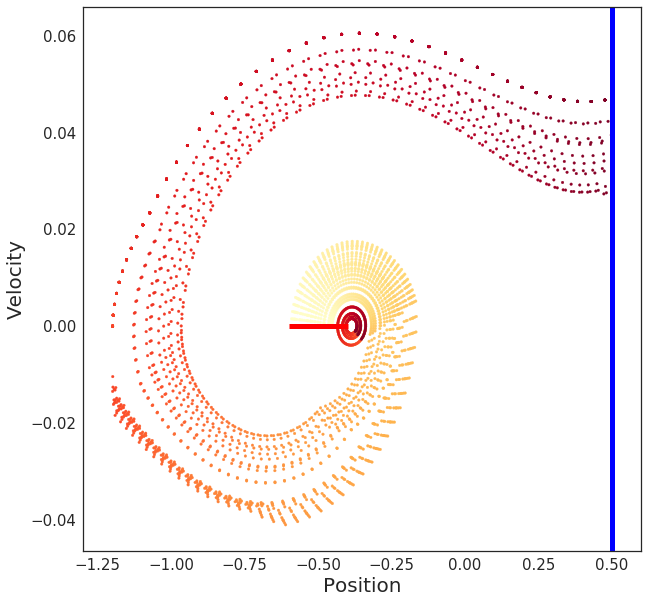

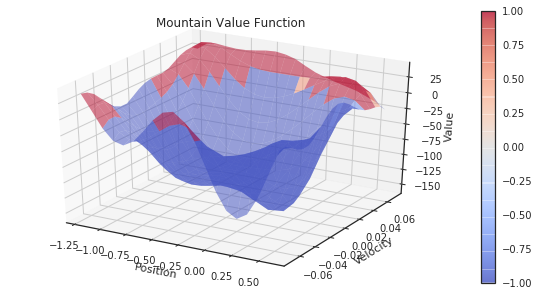

Step 87 @ Episode 30/30 (-101.0))

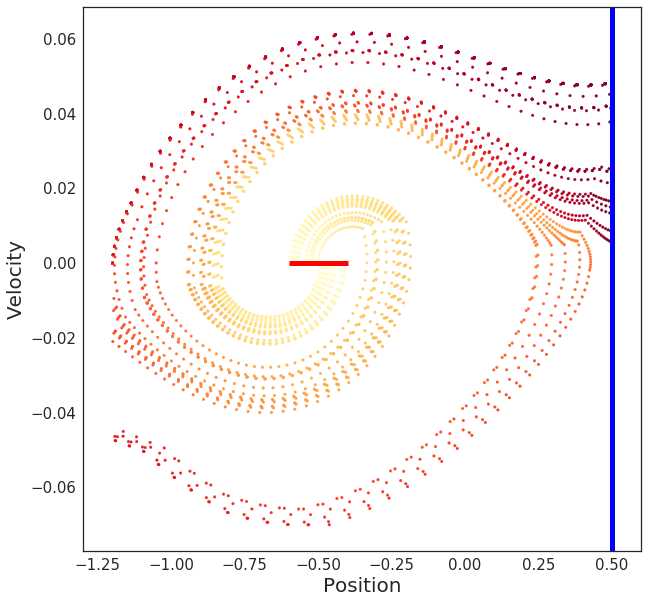

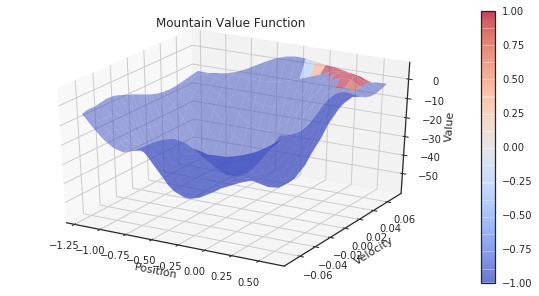

Step 109 @ Episode 30/30 (-114.0)

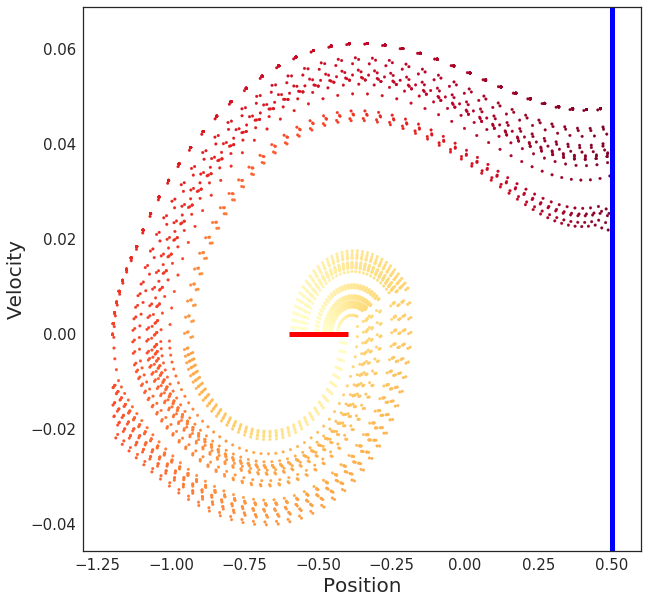

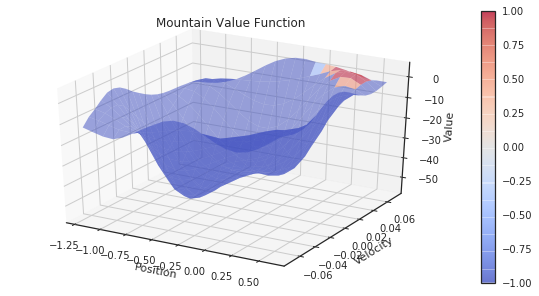

Step 85 @ Episode 30/30 (-115.0))

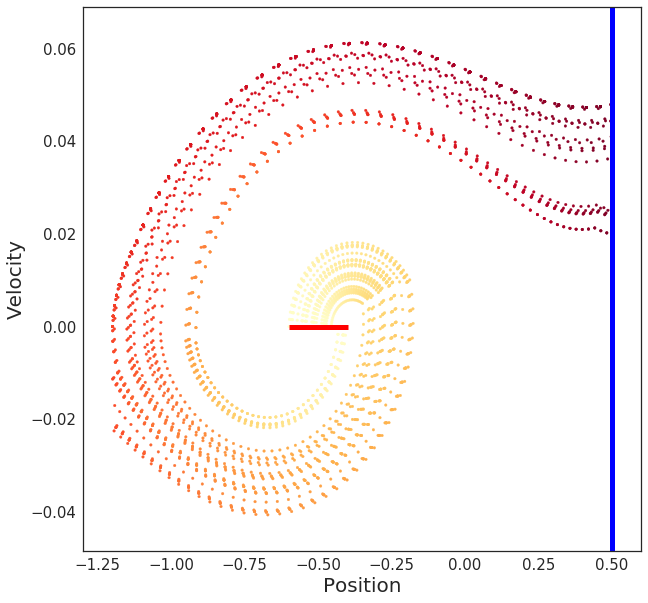

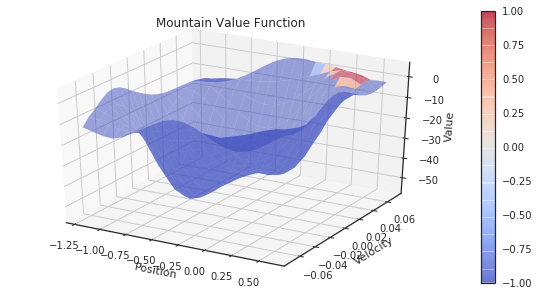

Step 110 @ Episode 30/30 (-113.0)

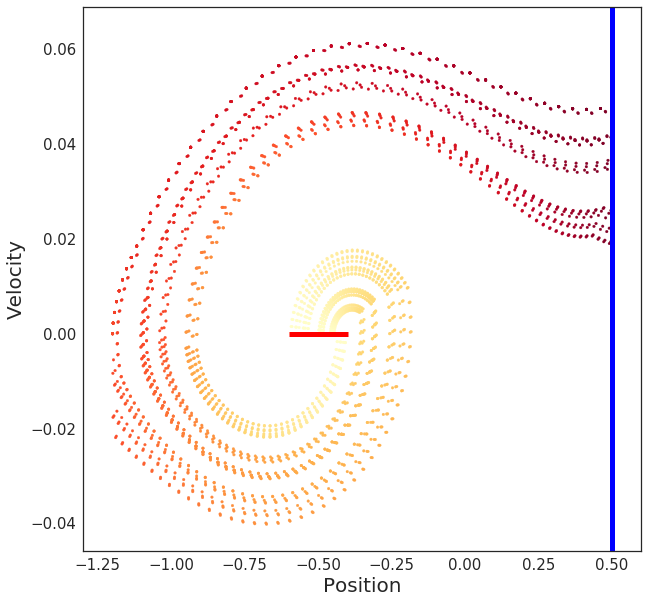

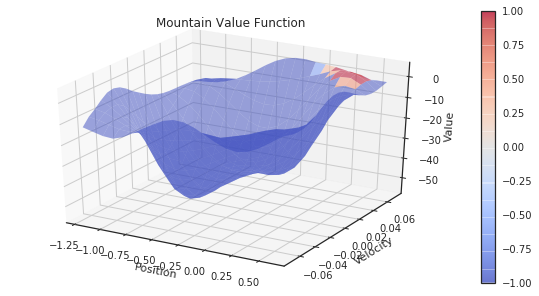

Step 109 @ Episode 30/30 (-87.0))

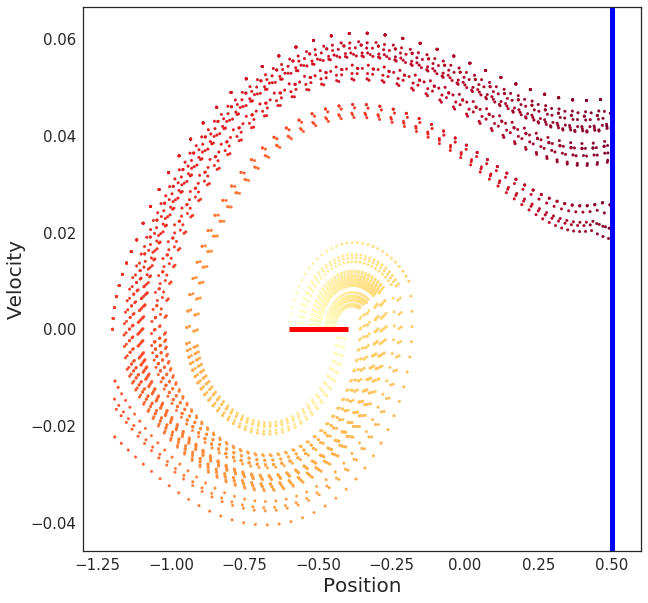

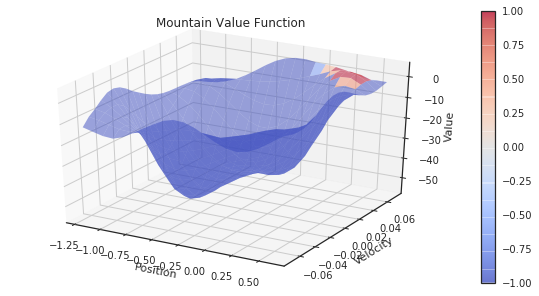

1

Step 198 @ Episode 30/30 (-200.0)

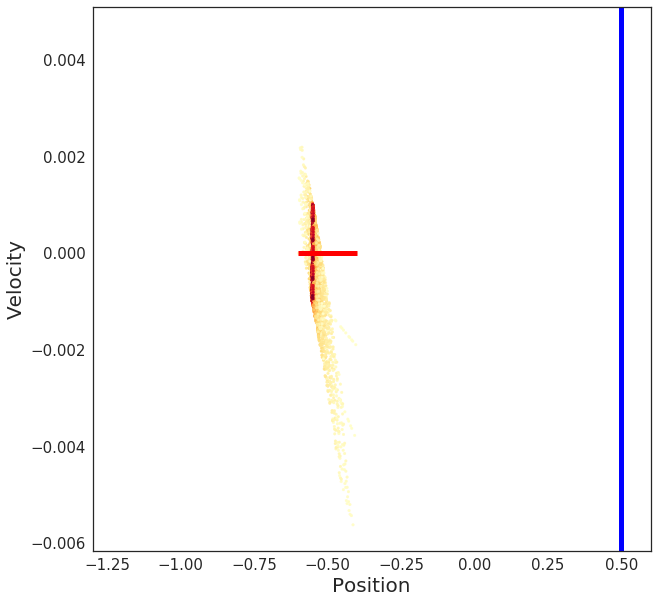

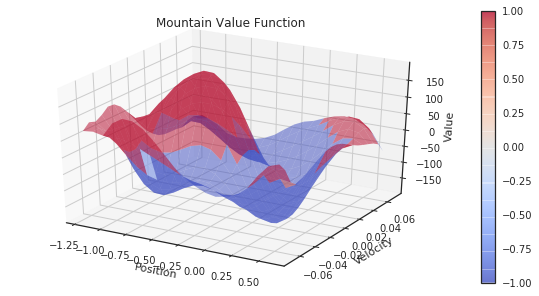

Step 198 @ Episode 30/30 (-200.0)

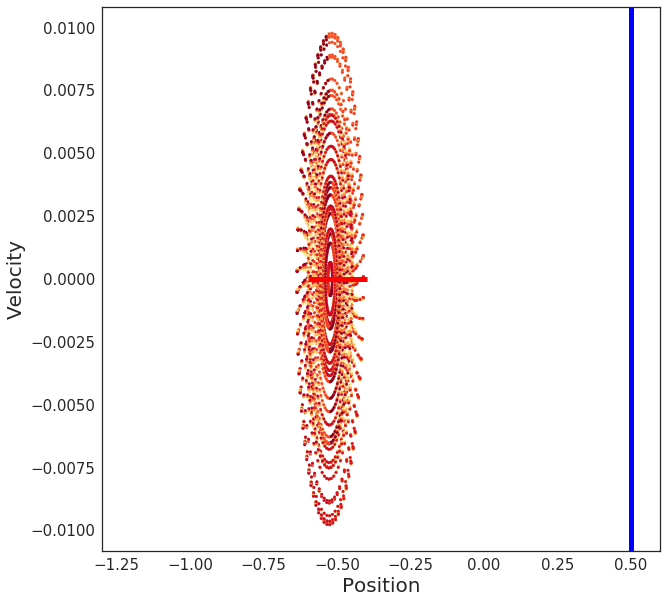

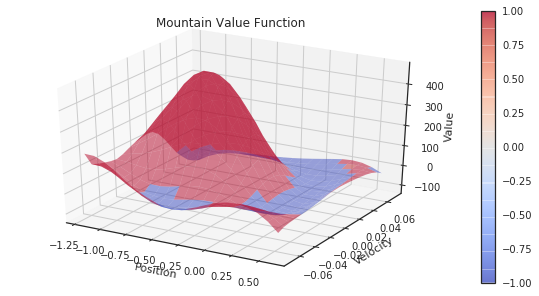

Step 198 @ Episode 30/30 (-200.0)

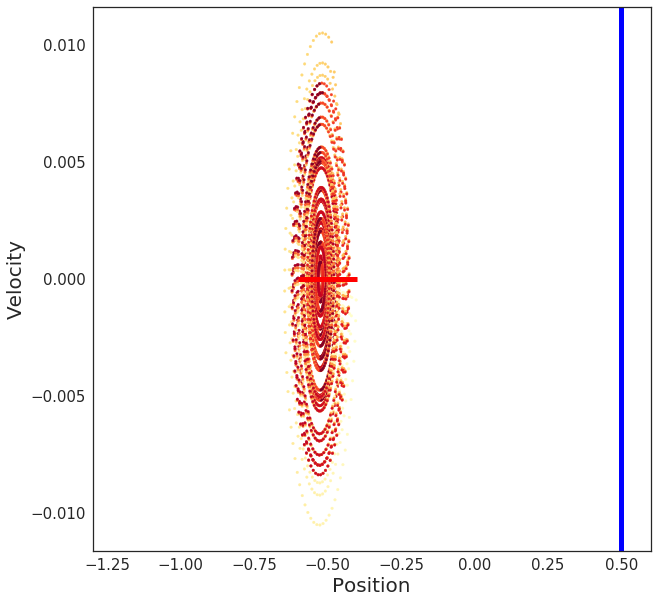

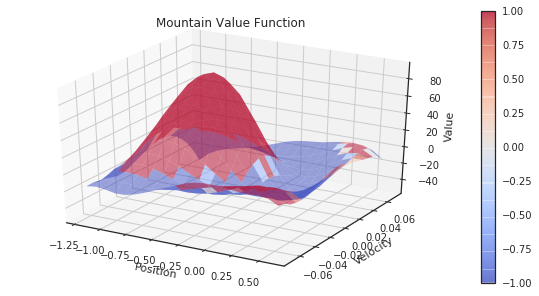

Step 198 @ Episode 30/30 (-200.0)

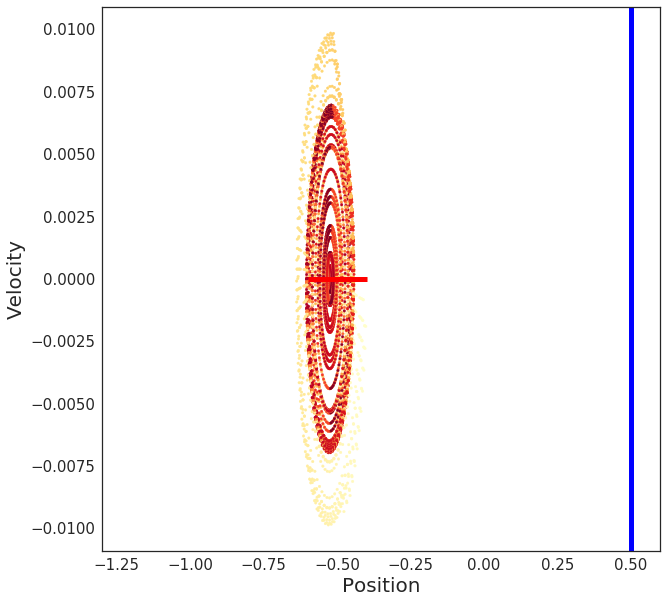

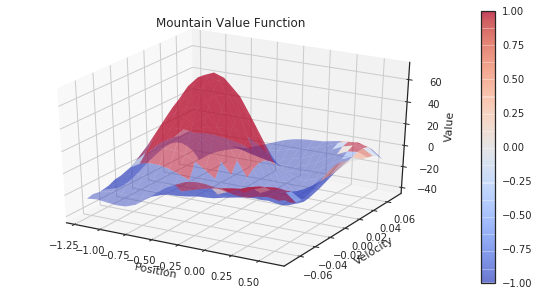

Step 198 @ Episode 30/30 (-200.0)

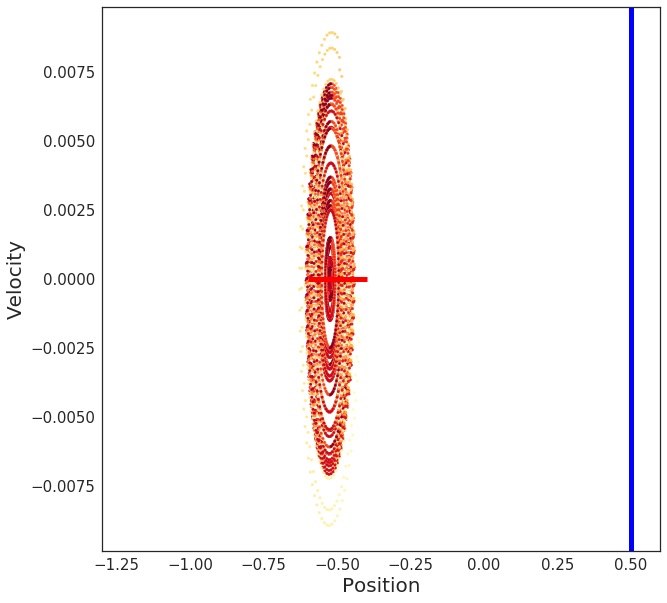

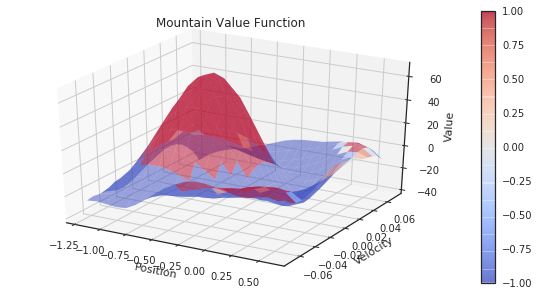

Step 198 @ Episode 30/30 (-200.0)

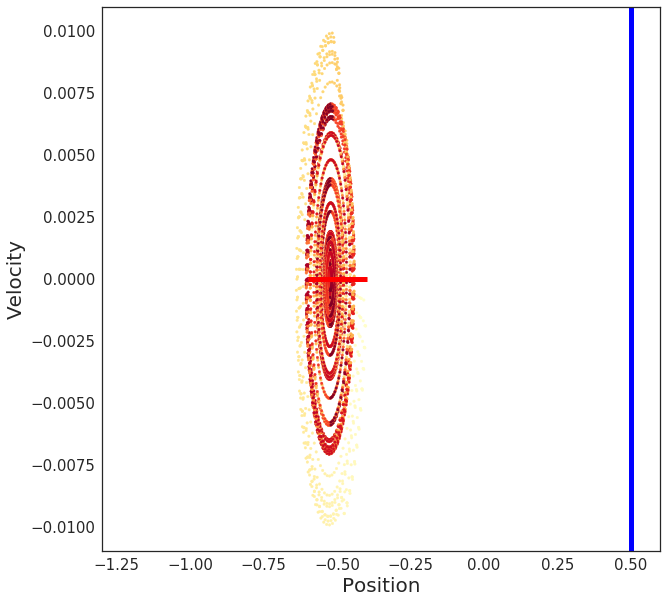

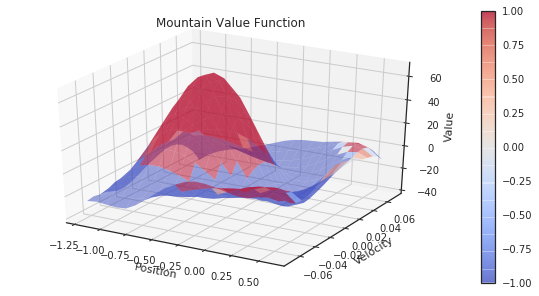

Step 198 @ Episode 30/30 (-200.0)

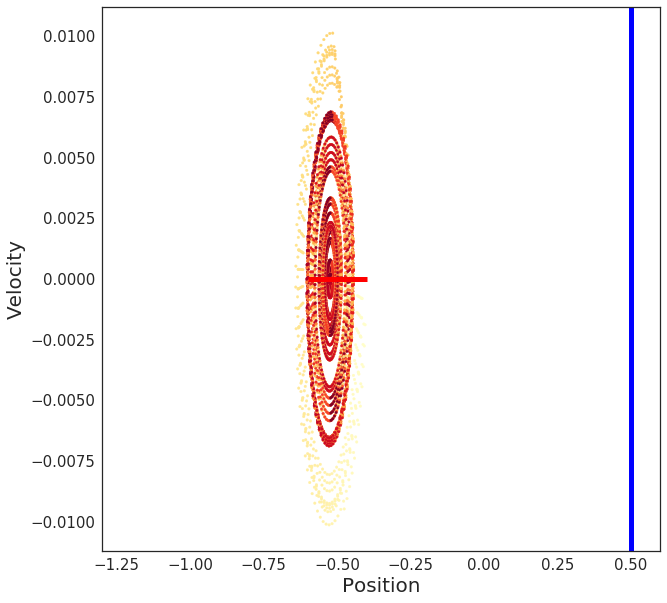

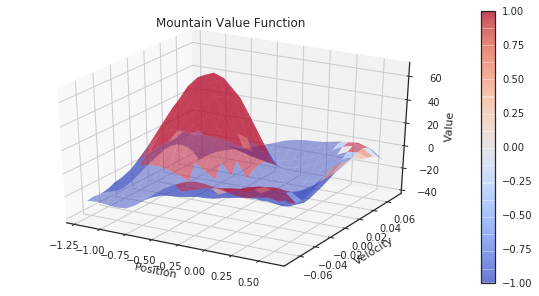

12

Step 187 @ Episode 30/30 (-116.0)

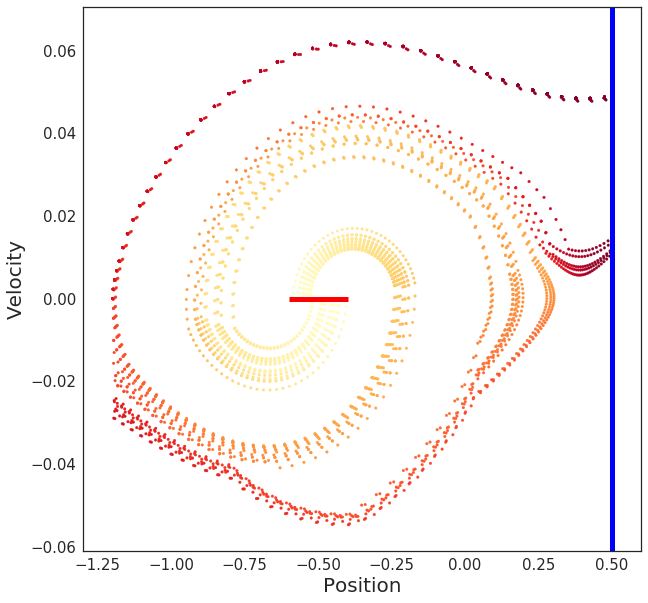

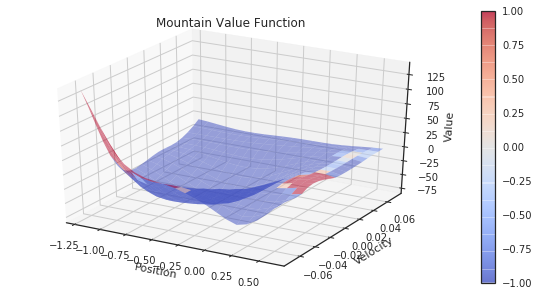

Step 198 @ Episode 30/30 (-200.0)

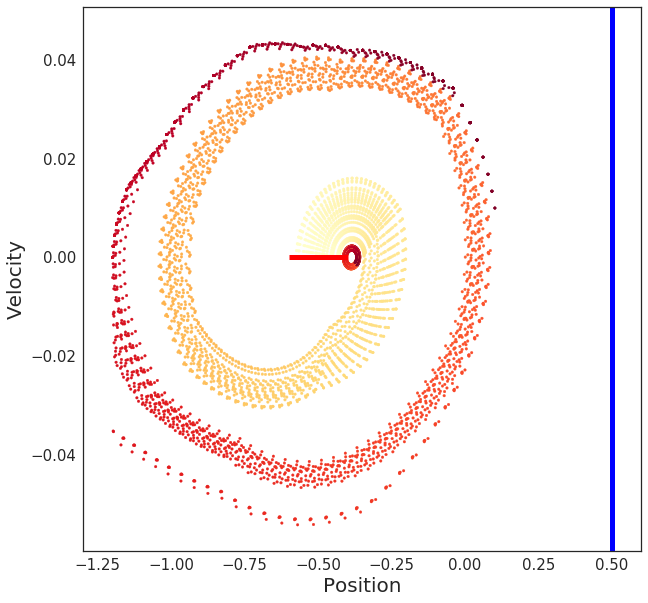

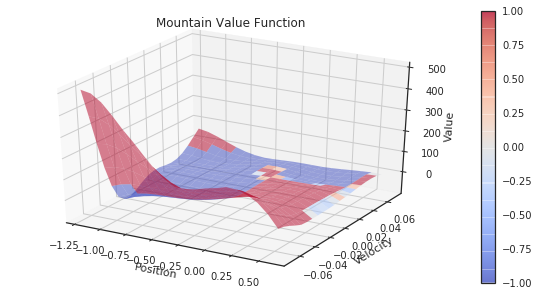

Step 116 @ Episode 30/30 (-117.0)

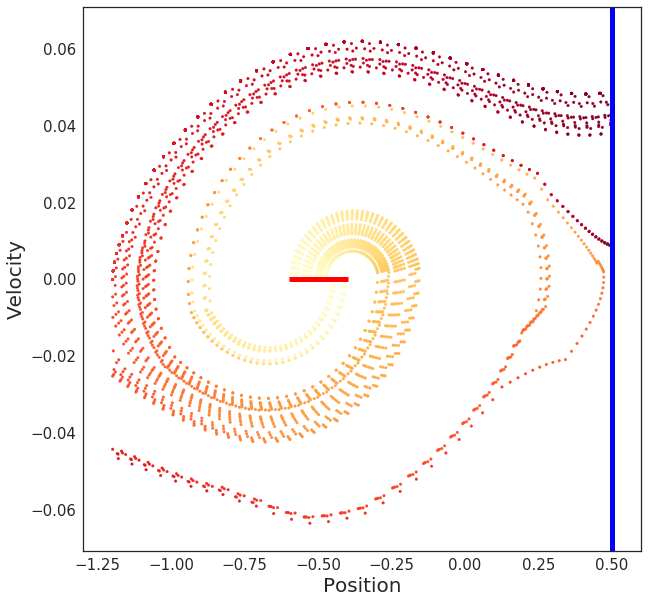

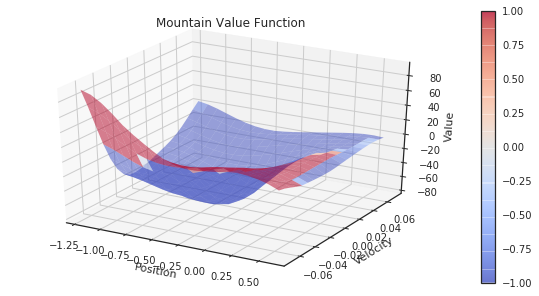

Step 110 @ Episode 30/30 (-152.0)

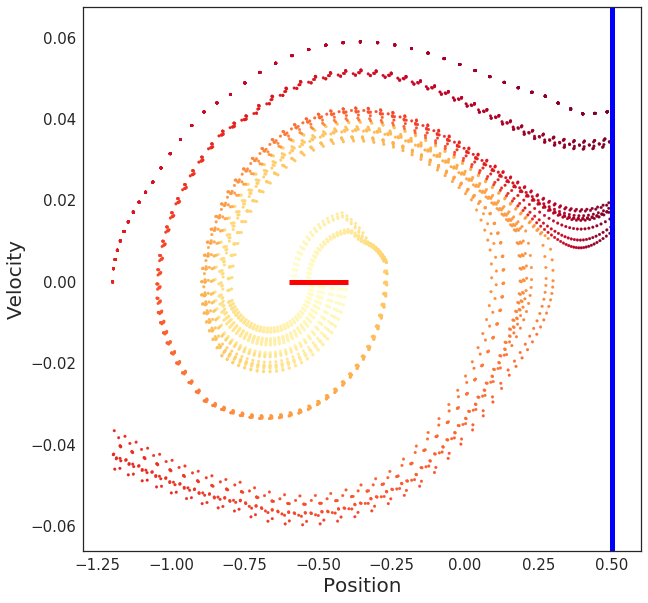

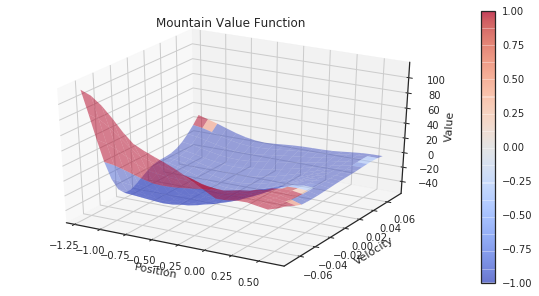

Step 88 @ Episode 30/30 (-114.0))

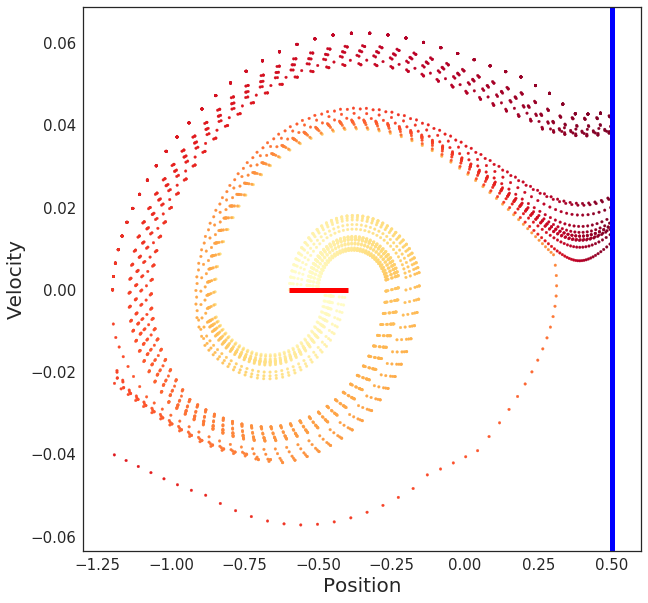

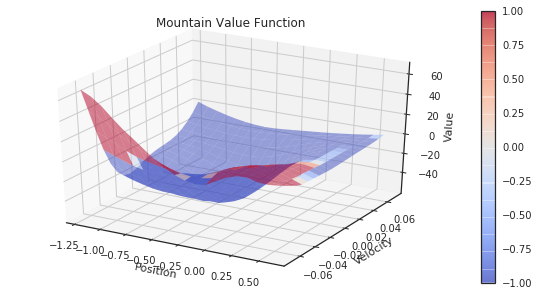

Step 110 @ Episode 30/30 (-111.0)

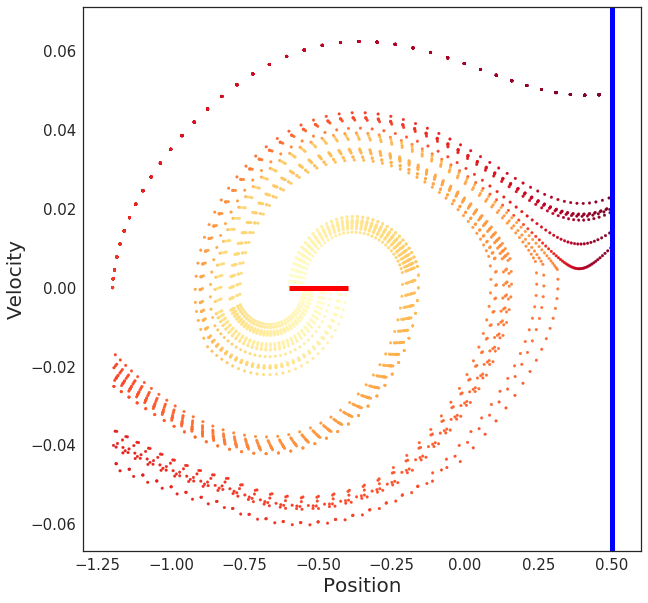

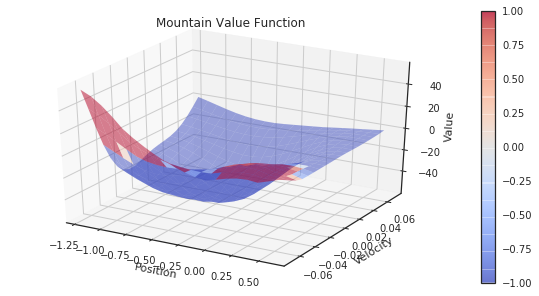

Step 164 @ Episode 30/30 (-154.0)

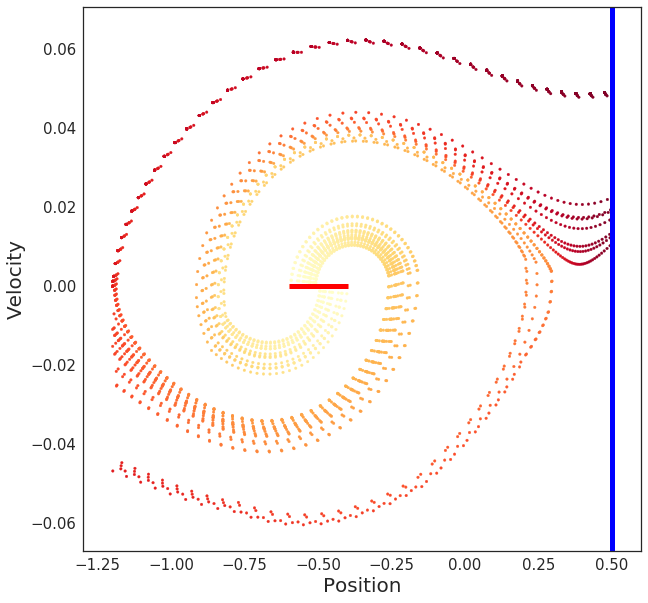

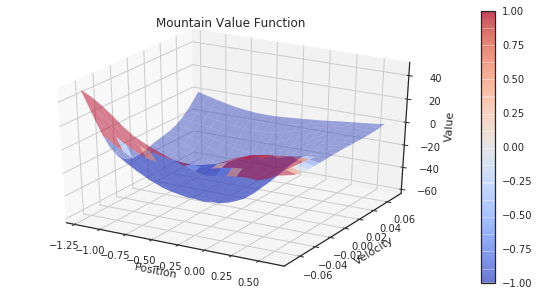

2

Step 198 @ Episode 30/30 (-200.0)

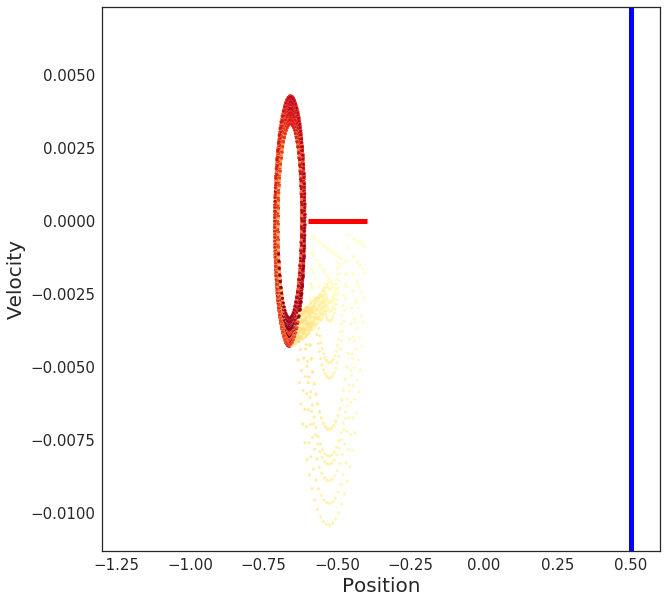

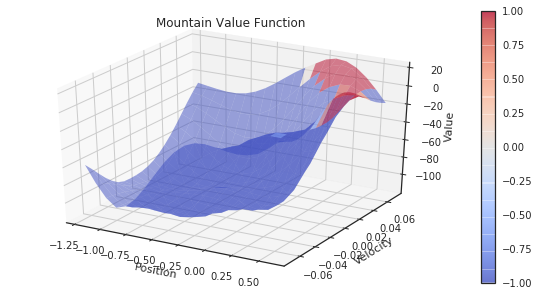

Step 198 @ Episode 30/30 (-200.0)

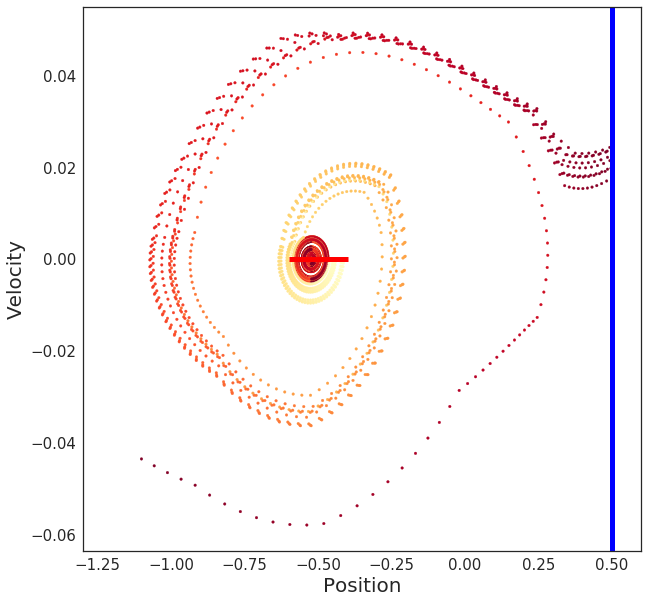

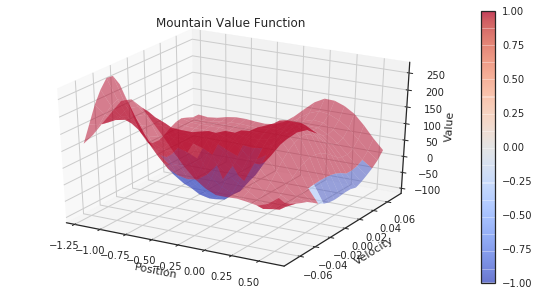

Step 198 @ Episode 30/30 (-200.0)

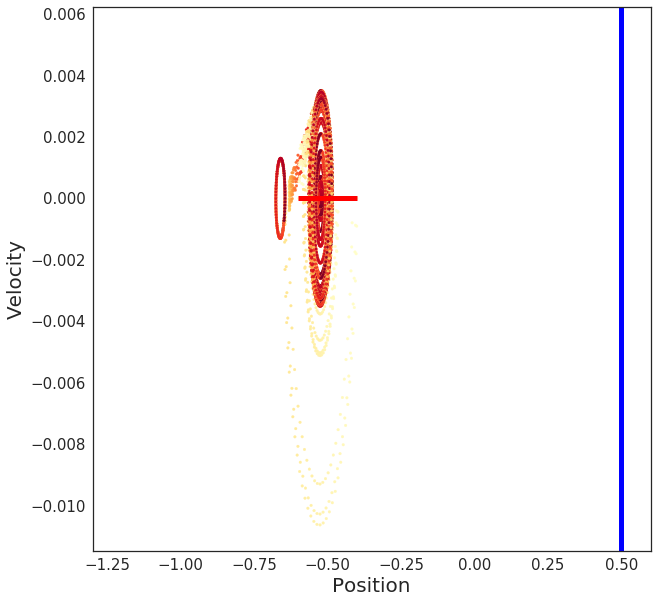

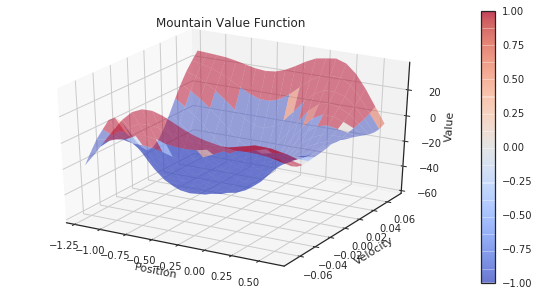

Step 122 @ Episode 30/30 (-200.0)

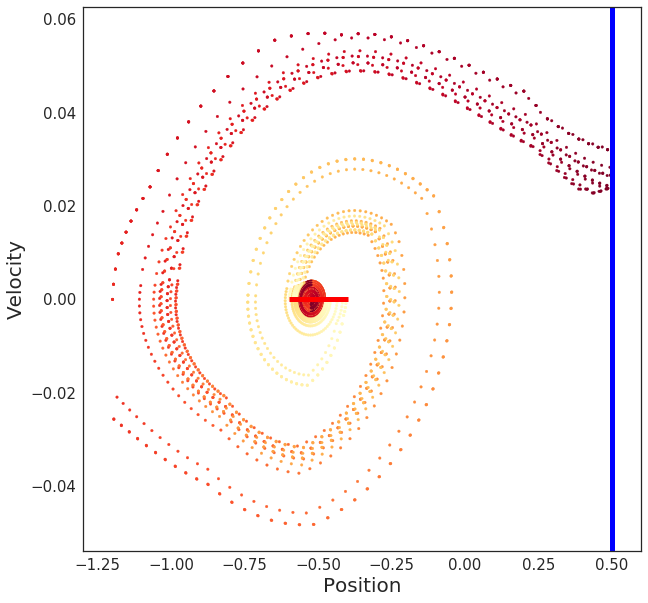

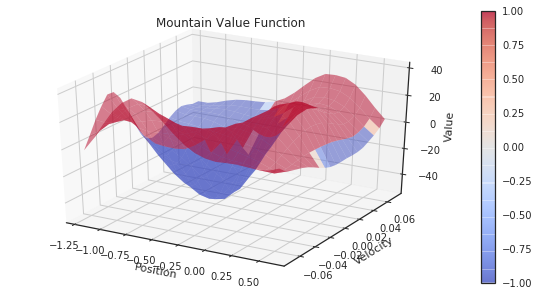

Step 198 @ Episode 30/30 (-200.0)

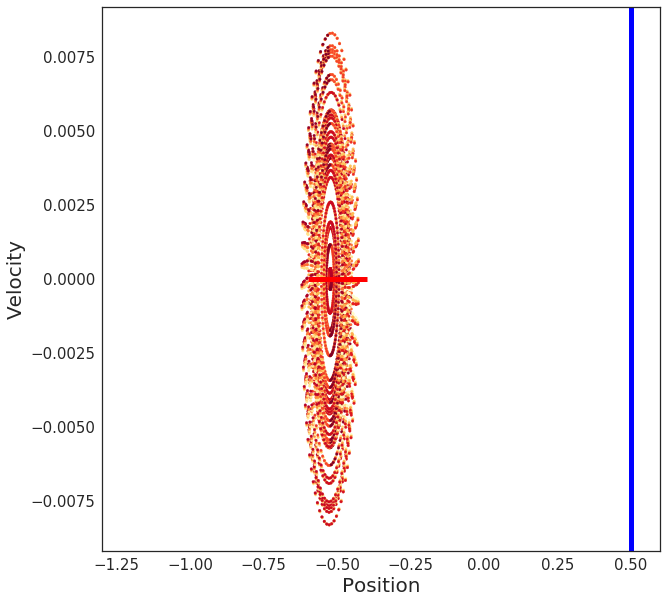

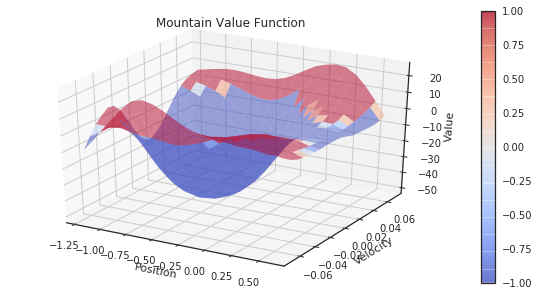

Step 152 @ Episode 30/30 (-158.0)

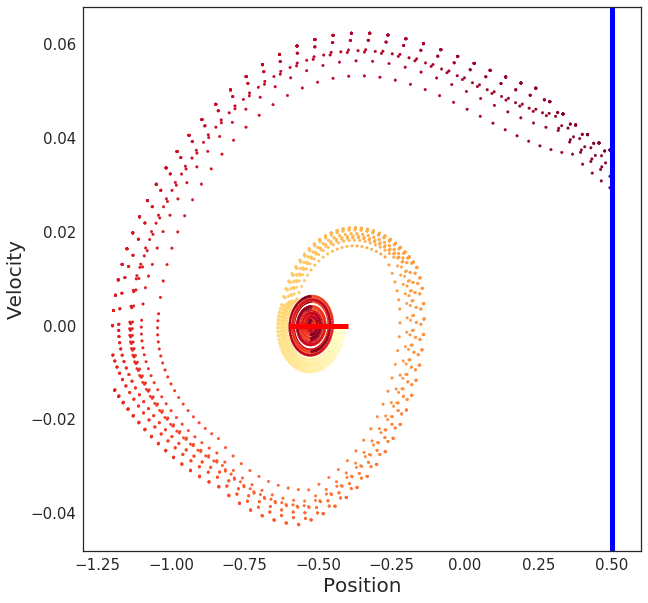

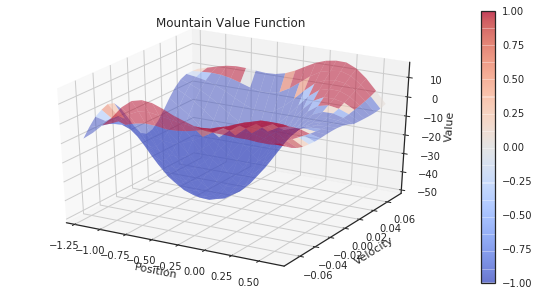

Step 198 @ Episode 30/30 (-200.0)

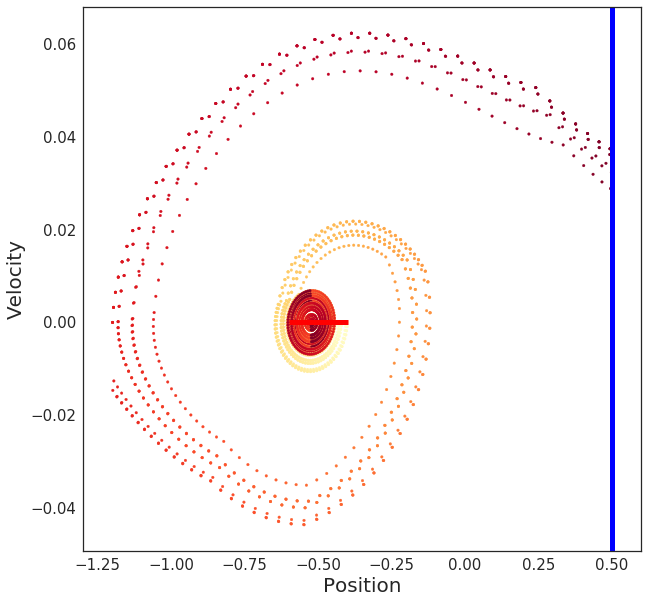

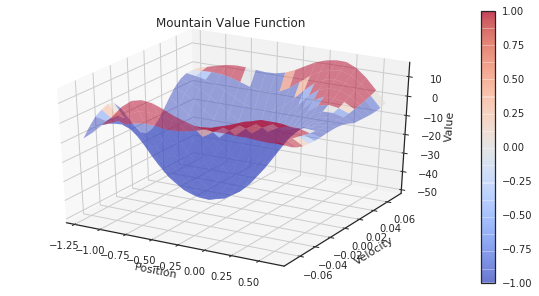

3

Step 198 @ Episode 30/30 (-200.0)

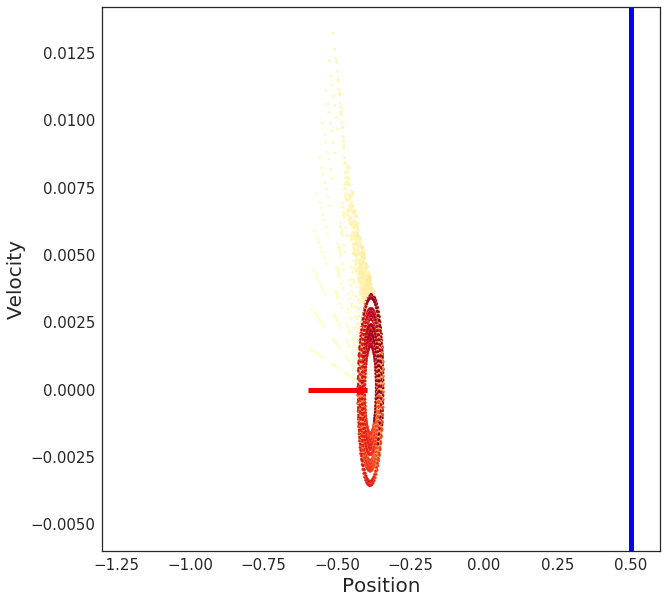

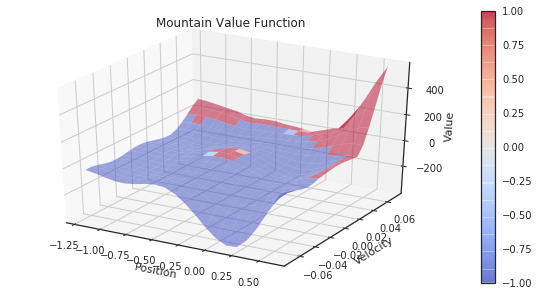

Step 198 @ Episode 30/30 (-200.0)

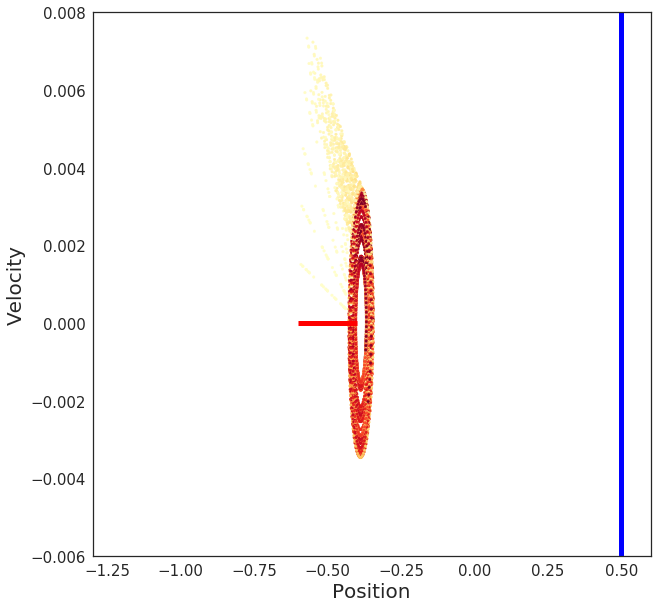

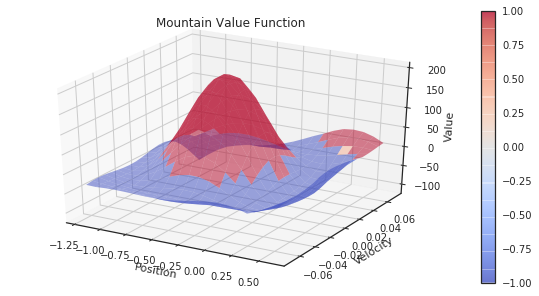

Step 198 @ Episode 30/30 (-200.0)

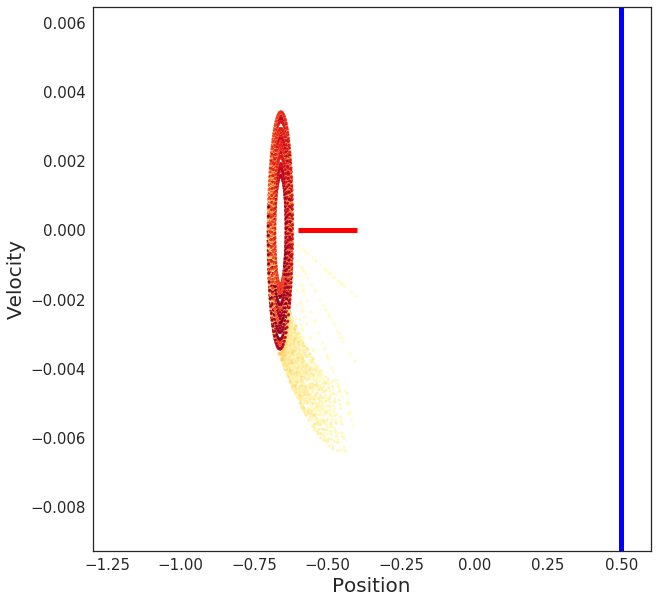

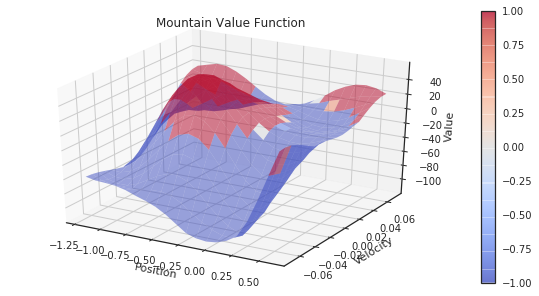

Step 198 @ Episode 30/30 (-200.0)

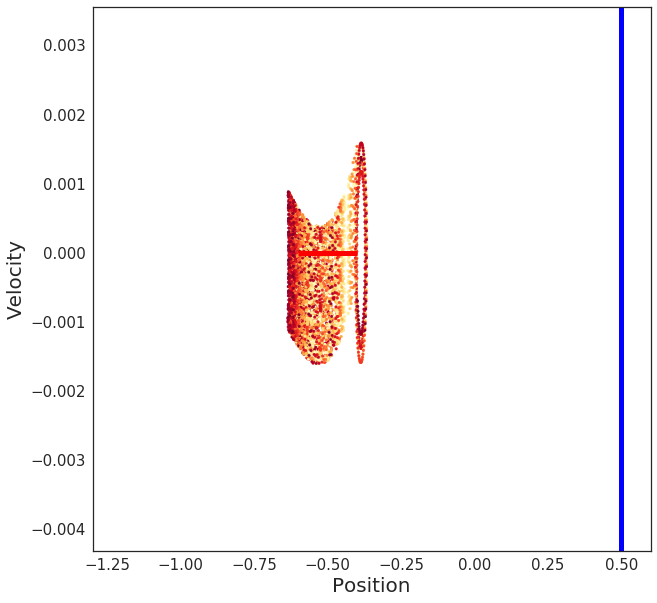

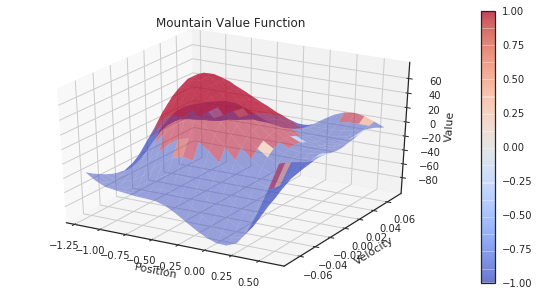

Step 198 @ Episode 30/30 (-200.0)

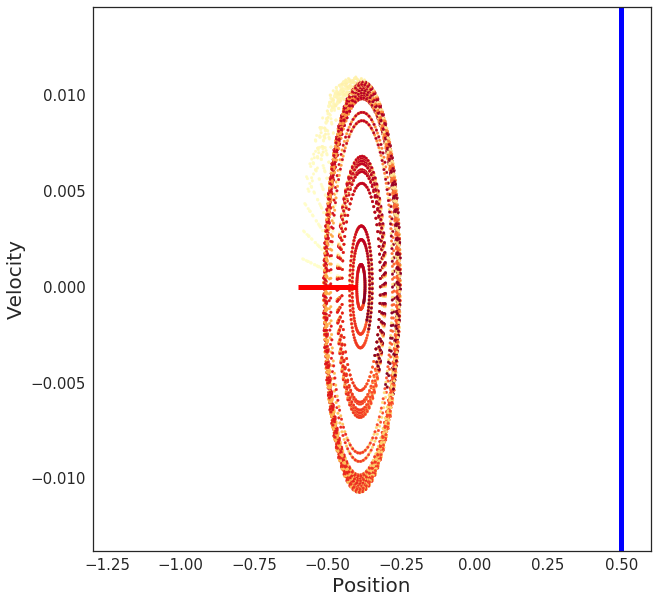

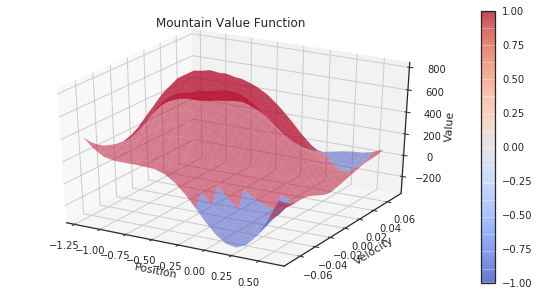

Step 198 @ Episode 30/30 (-200.0)

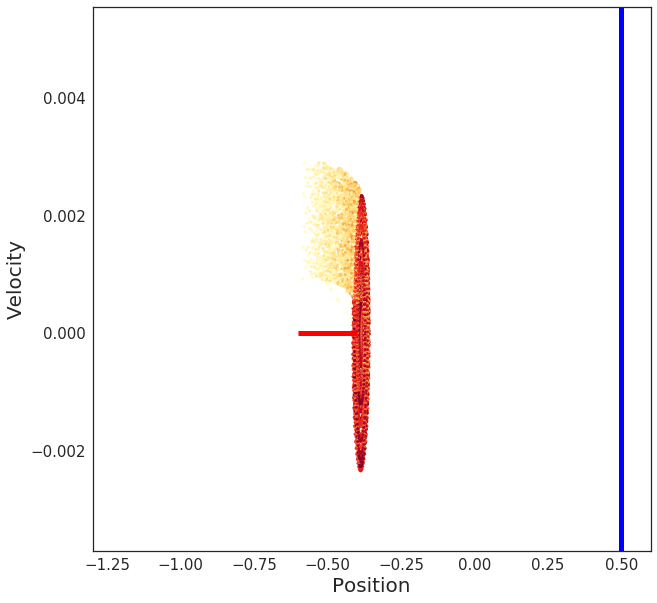

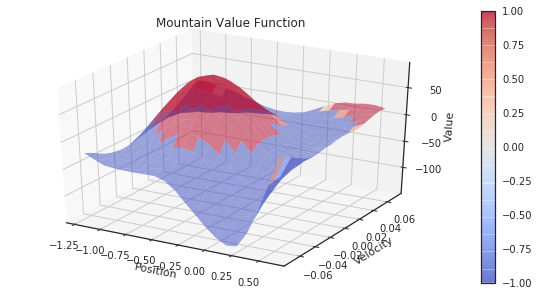

Step 198 @ Episode 30/30 (-200.0)

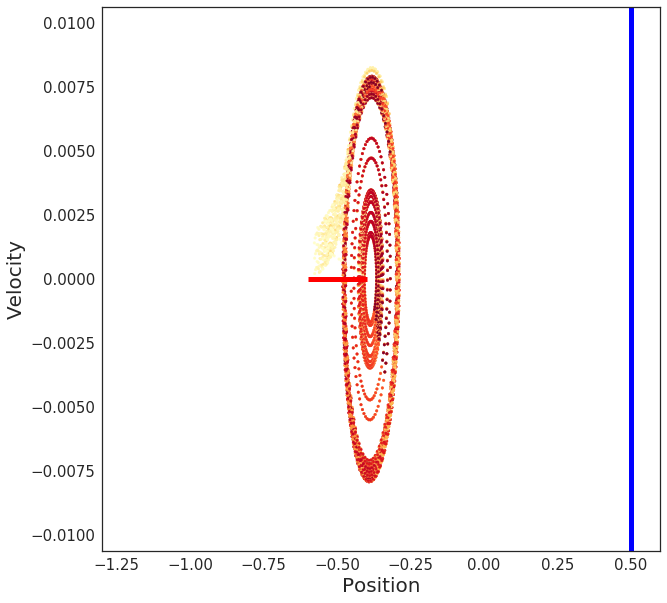

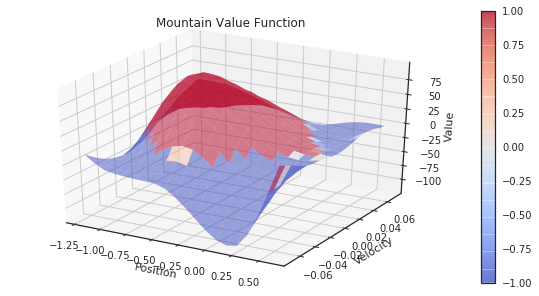

34

Step 198 @ Episode 30/30 (-200.0)

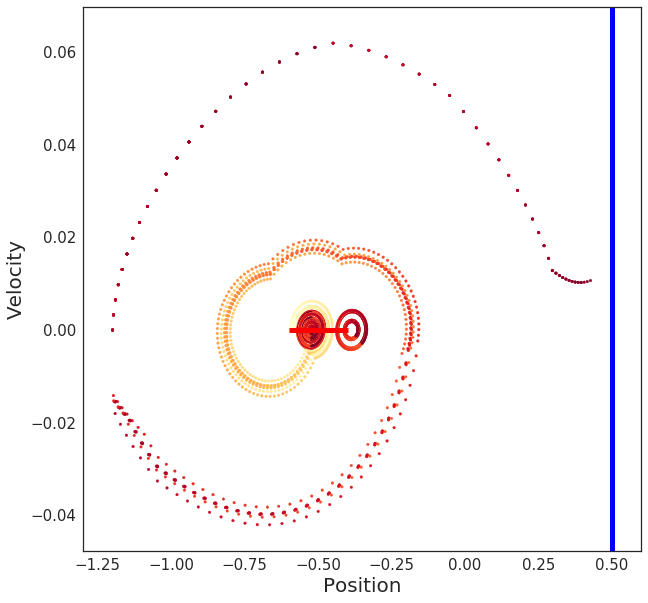

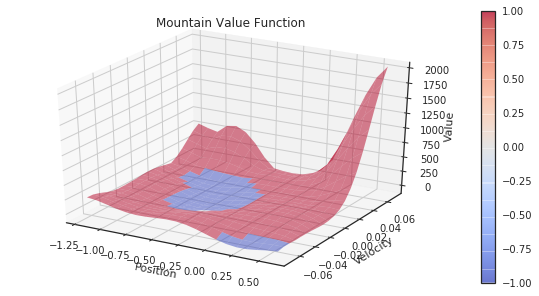

Step 153 @ Episode 30/30 (-155.0)

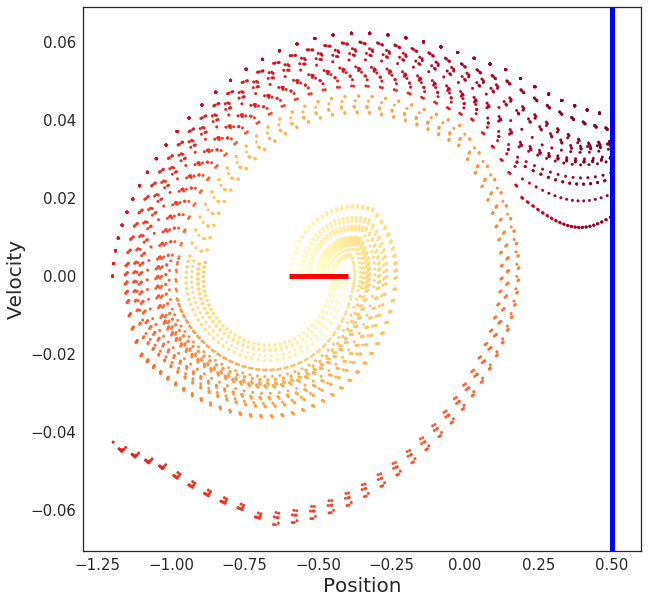

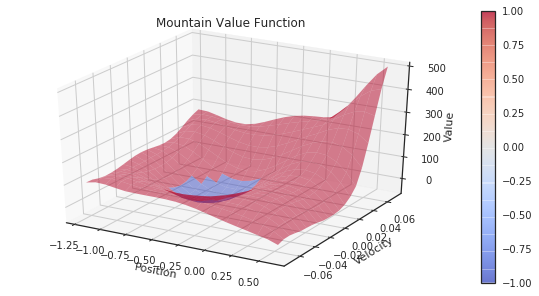

Step 162 @ Episode 30/30 (-163.0)

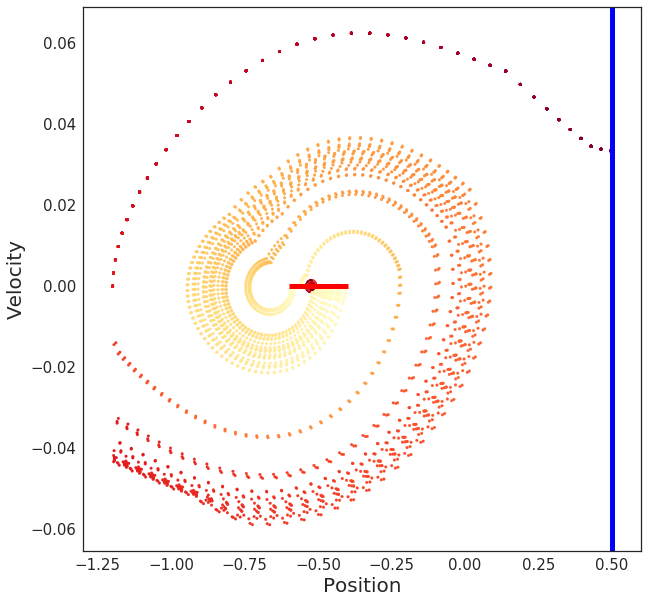

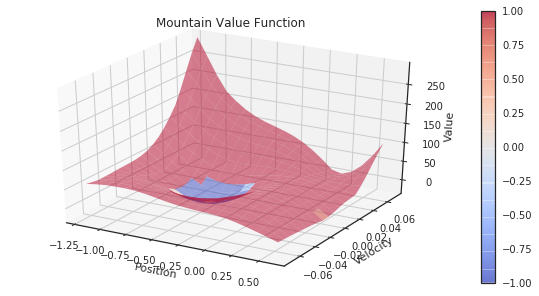

Step 198 @ Episode 30/30 (-161.0)

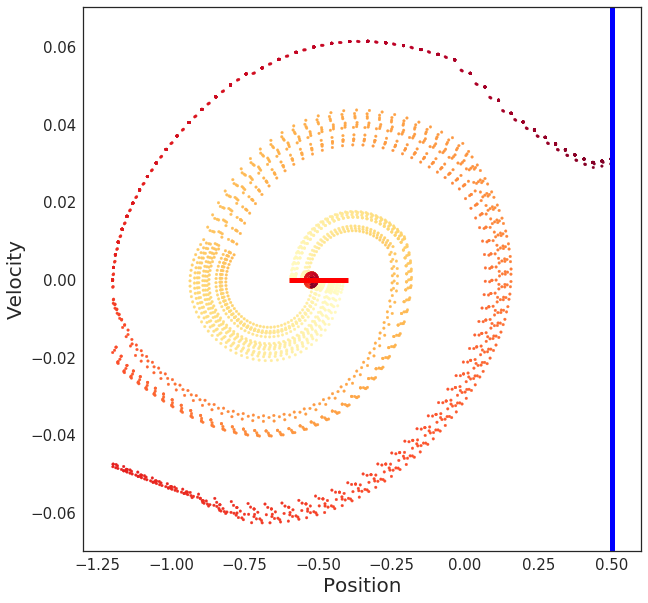

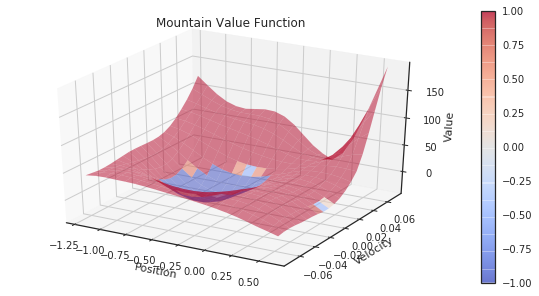

Step 198 @ Episode 30/30 (-200.0)

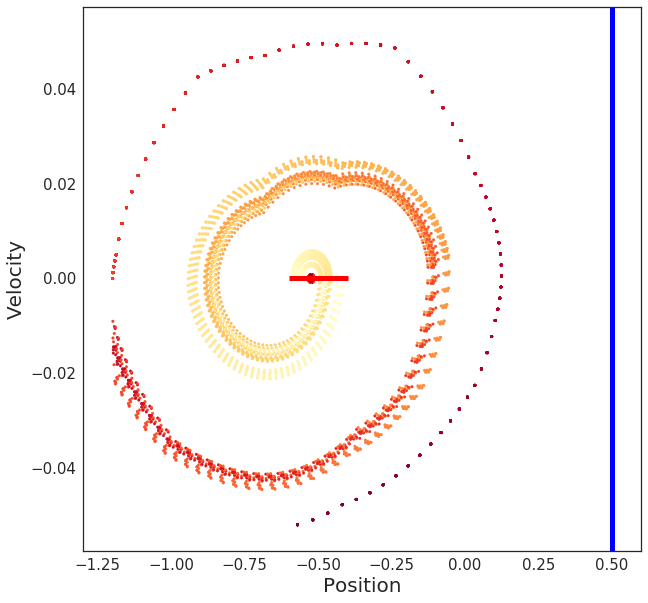

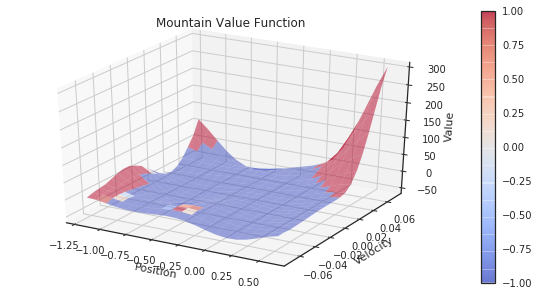

Step 198 @ Episode 30/30 (-200.0)

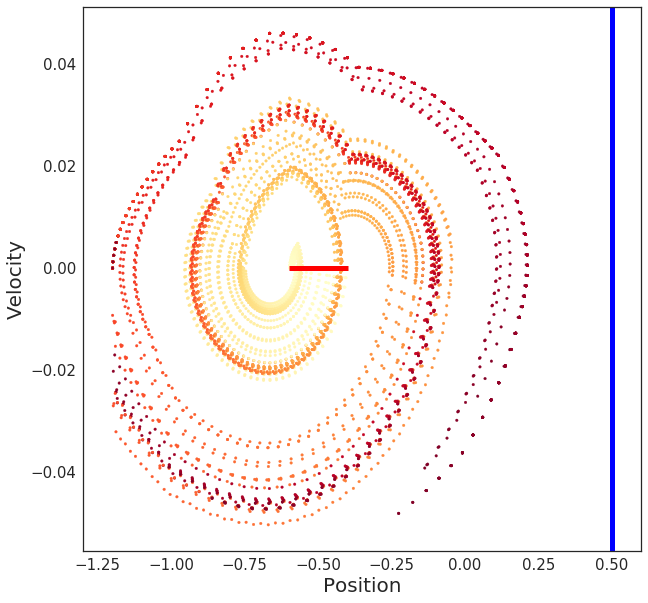

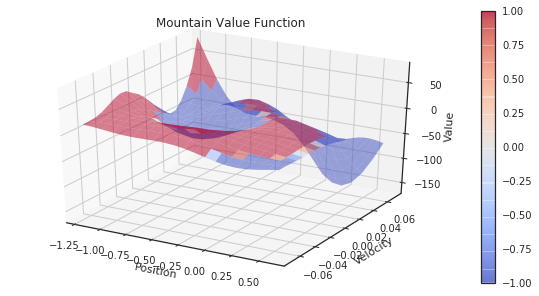

Step 198 @ Episode 30/30 (-200.0)

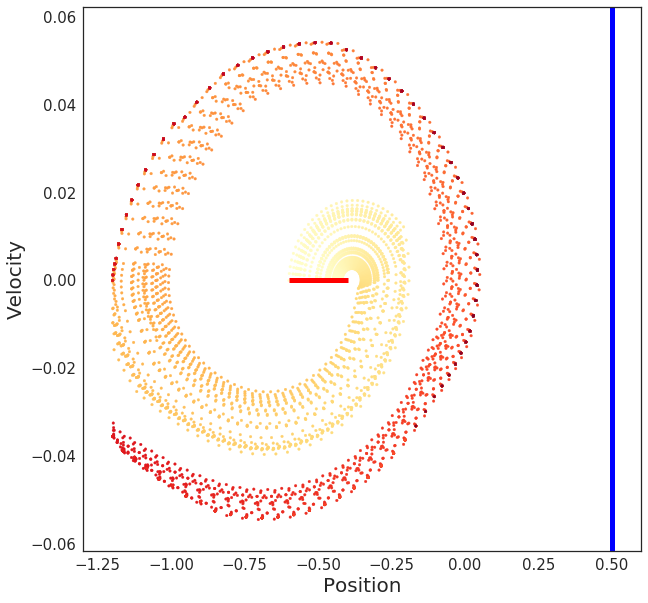

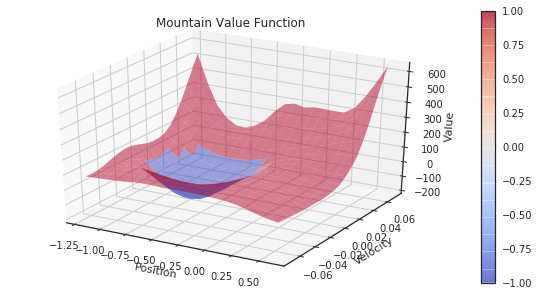

4

Step 198 @ Episode 30/30 (-200.0)

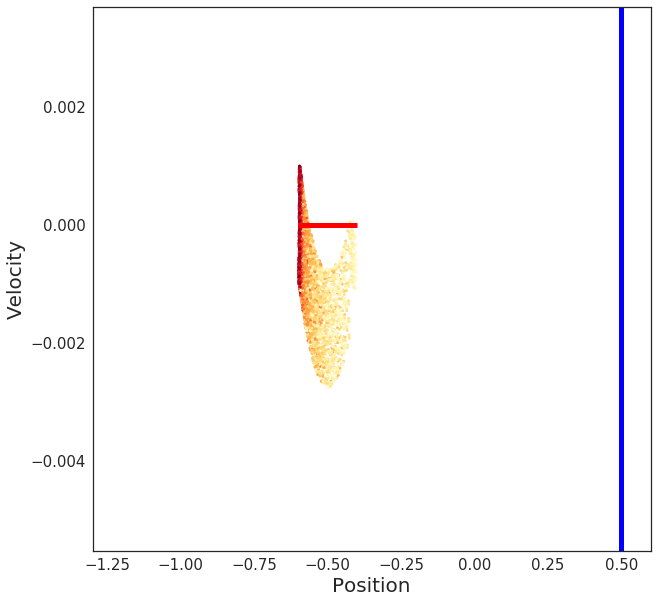

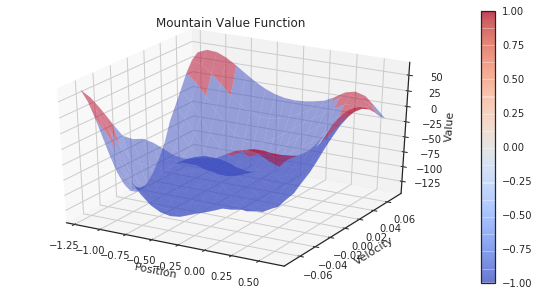

Step 198 @ Episode 30/30 (-200.0)

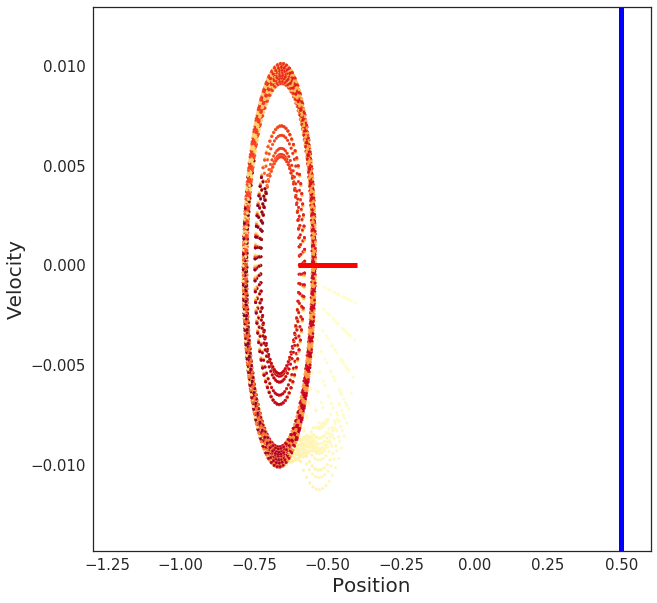

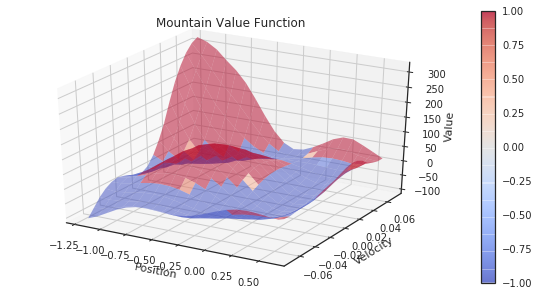

Step 198 @ Episode 30/30 (-172.0)

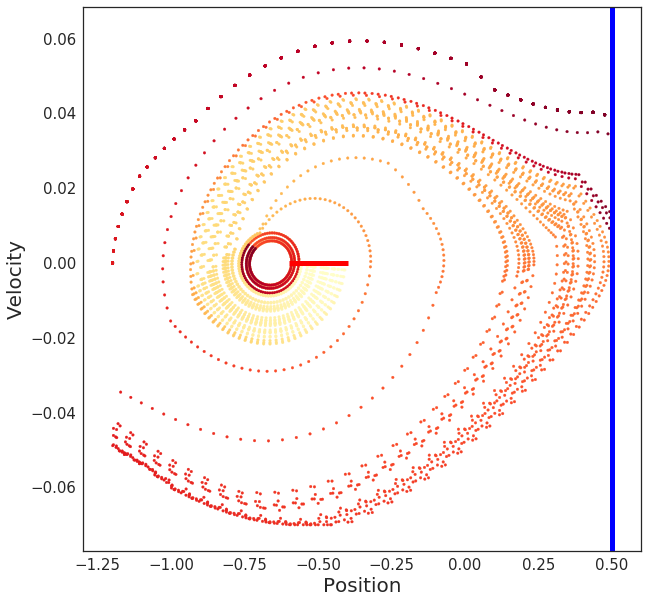

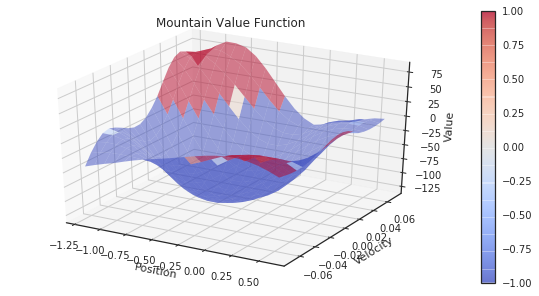

Step 129 @ Episode 30/30 (-136.0)

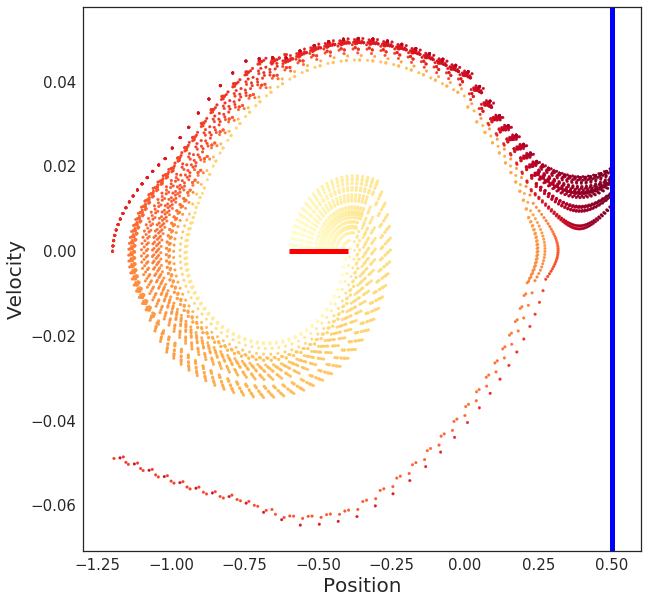

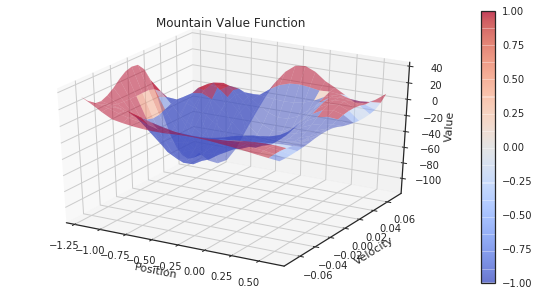

Step 166 @ Episode 30/30 (-115.0)

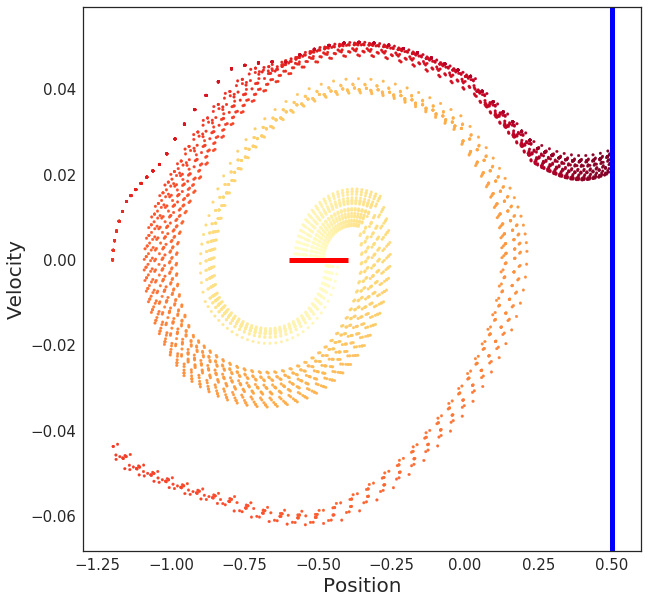

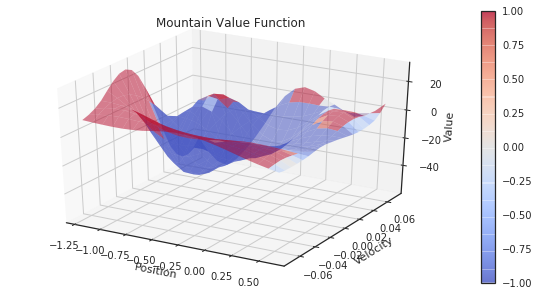

Step 161 @ Episode 30/30 (-164.0)

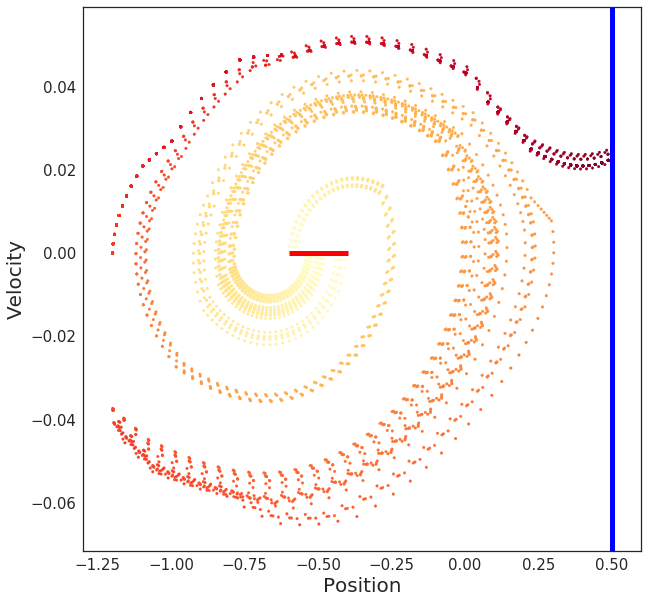

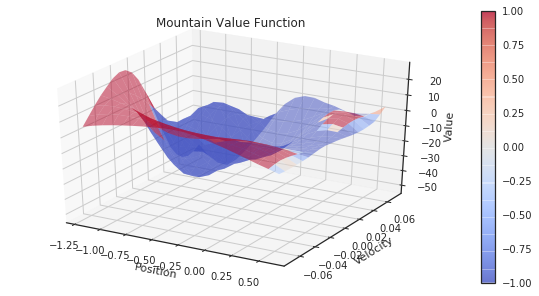

Step 121 @ Episode 30/30 (-171.0)

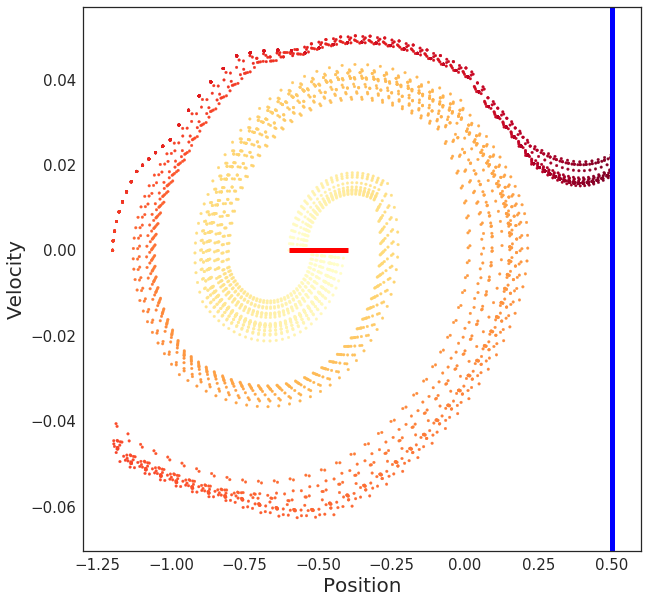

In [ ]:
phi = phi_gaus

for name in coverage_results:
    w_list = coverage_results[name]
    print("==================================")
    print(name)
    print("")
    for w in w_list: 
        pi_star = LinearQ2(action_list=action_list, phi=phi, W=w)
        #pi_star = LinearQ2(action_list=action_list, phi=phi_linear, W=W_linear)
        D_star, stats = sim.simulate(pi=pi_star, n_trial=1, n_episode=30, return_stats=True)
        plot_trajectory_mountain_car(D_star)    
        plot_cost_to_go_mountain_car(env, pi_star)
        #plot_episode_stats(stats, smoothing_window=5)
    print("==================================")


# study the sensitivity of LSPI to reward functions
- the default reward function is -1 always
- generally, lspi norm varies with reward function choice (why?)

In [15]:
# preprocess reward if needed
def reward_fn1(s, a):
    pos, v = s
    return 1 if pos > 0.45 else 0

def reward_fn2(s, a):
    pos, v = s
    return 10*(pos + 0.6)**2

def reward_fn3(s, a):
    pos, v = s
    if pos < -0.75:
        return 0
    elif pos < 0.25:
        return -1
    else:
        return 100


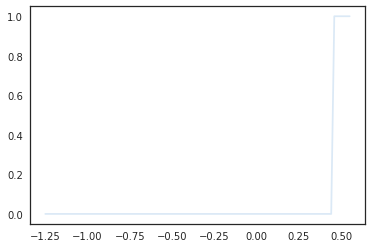

In [16]:
xx = np.linspace(-1.25, 0.55, 100)
r = [reward_fn1([x, 0], 0) for x in xx]
plt.plot(xx, r)

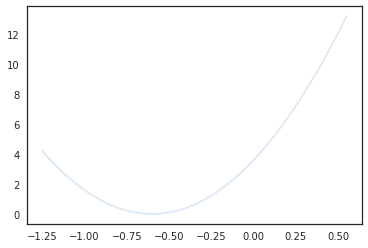

In [17]:
xx = np.linspace(-1.25, 0.55, 100)
r = [reward_fn2([x, 0], 0) for x in xx]
plt.plot(xx, r)

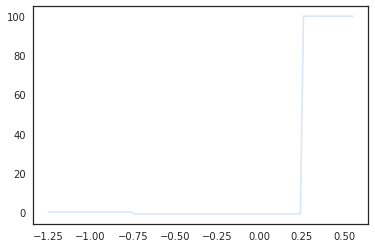

In [18]:
xx = np.linspace(-1.25, 0.55, 100)
r = [reward_fn3([x, 0], 0) for x in xx]
plt.plot(xx, r)

(array([  482.,   933.,   955.,  3016.,  5484.,  1789.,   400.,   410.,
          398.,   375.]),
 array([-1.2       , -1.03010847, -0.86021694, -0.6903254 , -0.52043387,
        -0.35054234, -0.18065081, -0.01075927,  0.15913226,  0.32902379,
         0.49891532]),
 <a list of 10 Patch objects>)

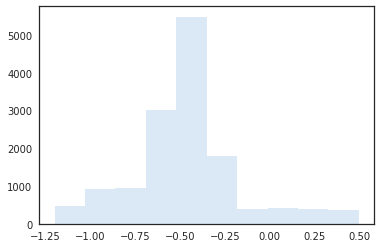

In [19]:
s = np.vstack(D_mat[:, 0])
a = np.vstack(D_mat[:, 1])
r = np.vstack([reward_fn2(s,a) for s, a in zip(s, a)])
plt.hist(s[:, 0])

## open questions
- what region is crucial?
- just uniformly important?
- does reward function change behavior of LSPI at all?
- why are behaviors w.r.t basis feature for online vs. batch setting so different? 